## Part-1

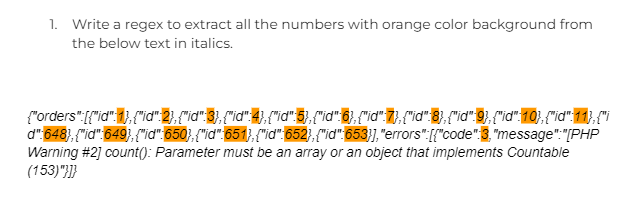

In [1]:
import re
text = '''{"orders":[{"id":1},{"id":2},{"id":3},{"id":4},{"id":5},{"id":6},{"id":7},{"id":8},{"id":9},{"id":10},{"id":11},{"id":648},{"id":649},{"id":650},
{"id":651},{"id":652},{"id":653}],"errors":[{"code":3,"message":"[PHP Warning #2] count(): Parameter must be an array or an object that implements Countable (153)"}]}'''

#() captures everything thats enclosed only although we use ':' for matching the pattern but it won't capture ':'
numbers = re.findall(':(\d+)', text) 
print(numbers)

['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '648', '649', '650', '651', '652', '653', '3']


# Contents:
<h3> Part-2 <h3>

<h4> 1. Data Loading </h4>

<h4> 2. Exploratory Data Analysis </h4>

<h4> 3. Data Cleaning (Handling Missing Values, Duplicates, Outliers) </h4>

<h4> 4. Feature Engineering (Extraction, Scaling and Selection) </h4>

<h4> 5. SMOTE for upsampling (Creating an Alternative Train Set) </h4>

<h4> 6. Model Building </h4>

<h4> 7. Model Evaluation </h4>

<h4> 8. Building Pipeline </h4>


# **1. Business/Real World Problem:**
A hotel(s) needs to predict whether a cutsomer would check in or not.

# **2. Mapping to Machine Learning Problem:** 

**2.1 Machine Learning Problem Statement:**  Given the customer and booking details, predict which customer would be checking in the hotel. 

**2.2 Type of Machine Learning Problem:** There is data provided about the check-ins of a customer. There are 2 possibilities whether the customer will check in or not. This is a Binary Classfication Problem.

**2.3 Performance Metric:**
- ROC-AUC Score 
- If we predict that the customer won't be checking in and the room is given to another person, but the customer actually checks in then that won't be good for the reputation of the hotel. 
- If we predict that the customer will be checking in and the room is kept reserved, but the customer actually does not check in then that would affect the hotel's revenue.
- Hence Precision and Recall both are important so, F1-Score would be a good performance metric

**2.4 Machine Learing Objectives and Constraints:** 
 
**2.4.1 Objecive:** Predict the probability of each data point belonging to Class 1 (i.e. Customer checks-in) 

**2.4.2 Constraints:**
 - Class Probability is needed 
 - No Low Latency Requirement 

refer- https://www.researchgate.net/publication/346330010_A_hotel's_customers_personal_behavioral_demographic_and_geographic_dataset_from_Lisbon_Portugal_2015-2018

Domain Knowledge: 
1. Hotels do not create a customer record for every guest. Usually, hotels only create a profile for the booking holder. However, some hotels have a policy of creating a profile for each guest companion (adult or children) only in particular cases. In Europe, a hotel can only create a profile if the customer gives express authorization. *(Express authorization means the agreement of the consumer expressed in a form that is evidenced by a written agreement signed by the consumer or by any electronically transferred authorization from the consumer that is stored, recorded, or retained by the supplier, such as a facsimile transmission, e-mail, telephonic, or other electronic means.)*

2. Typically, a customer profile is created in one of three moments: at the customer’s first checked-out at the hotel, at the customer first cancelation, or the customer’s first no-show.
3. Due to PMS application malfunctions, user errors, customers providing different identification documents or use other names (e.g., first plus last name or full name), sometimes hotels have
more than one profile for the same customer.
4. Usually, only one personal information is necessary to make a booking at a hotel: the booking holder’s name.
5. Only after a customer’s first stay can hotels confirm the guest’s personal details, such as nationality, identification card number, and birthdate, among others.

# 1. Data Loading

In [2]:
#import dependencies
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
import re

In [3]:
!gdown 1Xzvw-z_glMcOYxJPJ4SckuKrVOulUuzO
!gdown 18S6iRbj6HJ1lo7YdYC3zyai-rImvylMk

Downloading...
From: https://drive.google.com/uc?id=1Xzvw-z_glMcOYxJPJ4SckuKrVOulUuzO
To: /content/train_data_evaluation_part_2.csv
100% 9.05M/9.05M [00:00<00:00, 30.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=18S6iRbj6HJ1lo7YdYC3zyai-rImvylMk
To: /content/test_data_evaluation_part2.csv
100% 105k/105k [00:00<00:00, 91.2MB/s]


In [4]:
train = pd.read_csv('/content/train_data_evaluation_part_2.csv',index_col="Unnamed: 0")
print(train.shape)
train.head(3)

(82580, 29)


,ID,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,...,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
0,1,PRT,51.0,150,45,371.0,105.3,1,0,3,...,0,0,0,0,0,0,0,0,0,0
1,2,PRT,NaN,1095,61,280.0,53.0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,3,DEU,31.0,1095,0,0.0,0.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
test = pd.read_csv('/content/test_data_evaluation_part2.csv', index_col="Unnamed: 0")
print(test.shape)
test.head(3)

(1000, 29)


,ID,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,...,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
82590,82591,SGP,47.0,11,0,0.00,0.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
82591,82592,SGP,16.0,11,130,483.48,155.1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
82592,82593,SGP,15.0,11,0,0.00,0.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# 2. Exploratory Data Analysis

## Descriptive Analysis

In [6]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,82580.0,41290.500000,23838.936952,1.0,20645.75,41290.5,61935.25,82580.00
Age,78834.0,45.468554,16.526276,-11.0,34.00,46.0,57.00,122.00
DaysSinceCreation,82580.0,459.138157,311.309295,12.0,183.00,406.0,728.00,1095.00
AverageLeadTime,82580.0,66.557205,87.928995,-1.0,0.00,30.0,104.00,588.00
LodgingRevenue,82580.0,300.457373,373.337007,0.0,66.40,234.0,403.80,21781.00
OtherRevenue,82580.0,67.890023,114.496223,0.0,2.00,39.0,88.00,7730.25
BookingsCanceled,82580.0,0.002047,0.067177,0.0,0.00,0.0,0.00,9.00
BookingsNoShowed,82580.0,0.000642,0.029725,0.0,0.00,0.0,0.00,3.00
BookingsCheckedIn,82580.0,0.798402,0.696880,0.0,1.00,1.0,1.00,66.00
PersonsNights,82580.0,4.667958,4.562507,0.0,1.00,4.0,7.00,116.00


Inferences: 
- Age feature depicts unusual values which are in negative 
- AverageLeadTime, DaysSinceLastStay, DaysSinceFirstStay have negative values need to look into those. 
- 75% of the customers have checked in <=1 time 
- 75% of the customers have never canceled a booking 
- 75% of the customers have never no showed on the check-in date 

Note: 
- There is a possibility that there are customers who have made no bookings and just exist as records in the database.
- Also a possibility lies that there are first time customers who have made a booking around the date of records extraction and therefore have no record of check-in, cancelation or noshow yet. (we'll see that upon more exploration)

In [7]:
print('Missing Values in Train:\n', train.isnull().sum()[train.isnull().sum()>0])
print('Missing Values in Test:\n',test.isnull().sum()[test.isnull().sum()>0])

Missing Values in Train:
 Age    3746
dtype: int64
Missing Values in Test:
 Age    33
dtype: int64


In [8]:
print("Percentage of Missing Age Values in Train: ", train.isnull().sum()['Age']/len(train))
print("Percentage of Missing Age Values in Test: ", test.isnull().sum()['Age']/len(test))

Percentage of Missing Age Values in Train:  0.04536207314119642
Percentage of Missing Age Values in Test:  0.033


In [9]:
print("Duplicates in Train:",train.duplicated().sum())
print("Duplicates in Test:",test.duplicated().sum())

Duplicates in Train: 0
Duplicates in Test: 0


In [10]:
print(train.drop(columns = ['ID']).duplicated().sum())
print(test.drop(columns = ['ID']).duplicated().sum())

2354
30


## Deriving the Target feature

In [11]:
train.columns

Index(['ID', 'Nationality', 'Age', 'DaysSinceCreation', 'AverageLeadTime',
       'LodgingRevenue', 'OtherRevenue', 'BookingsCanceled',
       'BookingsNoShowed', 'BookingsCheckedIn', 'PersonsNights', 'RoomNights',
       'DaysSinceLastStay', 'DaysSinceFirstStay', 'DistributionChannel',
       'MarketSegment', 'SRHighFloor', 'SRLowFloor', 'SRAccessibleRoom',
       'SRMediumFloor', 'SRBathtub', 'SRShower', 'SRCrib', 'SRKingSizeBed',
       'SRTwinBed', 'SRNearElevator', 'SRAwayFromElevator',
       'SRNoAlcoholInMiniBar', 'SRQuietRoom'],
      dtype='object')

In [12]:
train['BookingsCheckedIn'].value_counts()

1     61737
0     19394
2      1141
3       132
4        59
5        20
6        20
7        16
8        10
9         9
10        7
11        6
12        4
13        4
29        3
15        3
23        2
14        2
25        1
17        1
66        1
26        1
57        1
40        1
18        1
24        1
19        1
20        1
34        1
Name: BookingsCheckedIn, dtype: int64

In [13]:
train['check_in'] = train['BookingsCheckedIn'].apply(lambda x: 0 if x==0 else 1)
test['check_in'] = test['BookingsCheckedIn'].apply(lambda x: 0 if x==0 else 1)

## Univariate Analysis

### Class Distribution

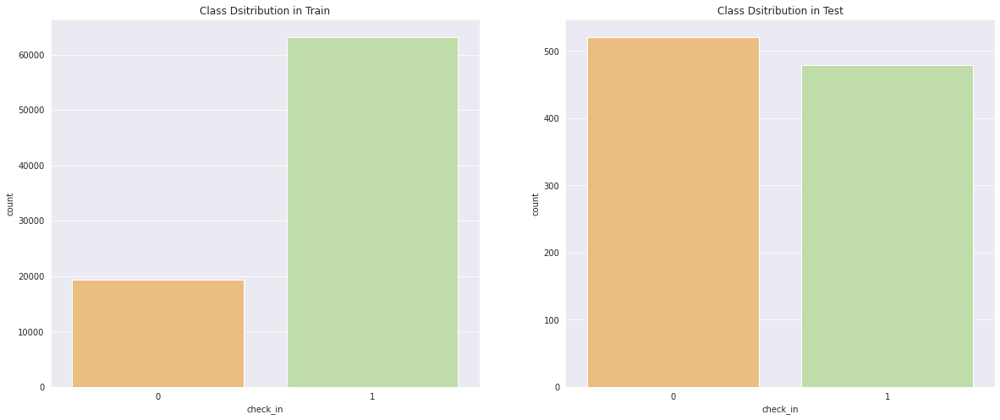

In [14]:
sns.set_style('darkgrid')
fig, ax = plt.subplots(1,2,figsize=(20,8))

sns.countplot(data = train, x = 'check_in',palette='Spectral', ax = ax[0])
ax[0].set(title = 'Class Dsitribution in Train')

sns.countplot(data = test, x = 'check_in', palette='Spectral',ax = ax[1])
ax[1].set(title = 'Class Dsitribution in Test')
plt.show()

In [15]:
print('Distribution in Train:\n',train['check_in'].value_counts(normalize=True))
print('Distribution in Test:\n',test['check_in'].value_counts(normalize=True))

Distribution in Train:
 1    0.765149
0    0.234851
Name: check_in, dtype: float64
Distribution in Test:
 0    0.521
1    0.479
Name: check_in, dtype: float64


- Clearly, the class distributions in train and test are not equal
- We can address this issue using upsampling/downsampling

In [16]:
numerical_feat = ['Age', 'DaysSinceCreation', 'AverageLeadTime',
       'LodgingRevenue', 'OtherRevenue', 'BookingsCanceled',
       'BookingsNoShowed', 'BookingsCheckedIn', 'PersonsNights', 'RoomNights',
       'DaysSinceLastStay', 'DaysSinceFirstStay']

categorical_feat_1 = ['SRHighFloor', 'SRLowFloor', 'SRAccessibleRoom',
       'SRMediumFloor', 'SRBathtub', 'SRShower', 'SRCrib', 'SRKingSizeBed',
       'SRTwinBed', 'SRNearElevator', 'SRAwayFromElevator',
       'SRNoAlcoholInMiniBar', 'SRQuietRoom']

categorical_feat_2 = ['DistributionChannel', 'MarketSegment']

In [17]:
def univariate_analysis(features, type):
    if type == 'category_1':
        plt.figure(figsize=(25,25))
        for i in range(1,len(features)+1):
            plt.subplot(4, 4, i)
            ax = sns.countplot(data = train, x = features[i-1])
            ax.set(xlabel = features[i-1], ylabel='Count', title= features[i-1]+' Distribution')

    if type == 'category_2':
        plt.figure(figsize=(15,15))
        for i in range(1,len(features)+1):
            plt.subplot(3, 1, i)
            ax = sns.countplot(data = train, x = features[i-1])
            ax.set(xlabel = features[i-1], ylabel='Count', title= features[i-1]+' Distribution')

    if type == 'number':
        plt.figure(figsize=(25, 25))
        for i in range(1,len(features)):
            plt.subplot(4, 3, i)
            ax = sns.histplot(data = train, x = features[i-1], bins=20, kde=True)
            ax.set(xlabel = features[i-1], ylabel='Count', title= features[i-1]+' Distribution')
            plt.grid()
    
    return plt.show()

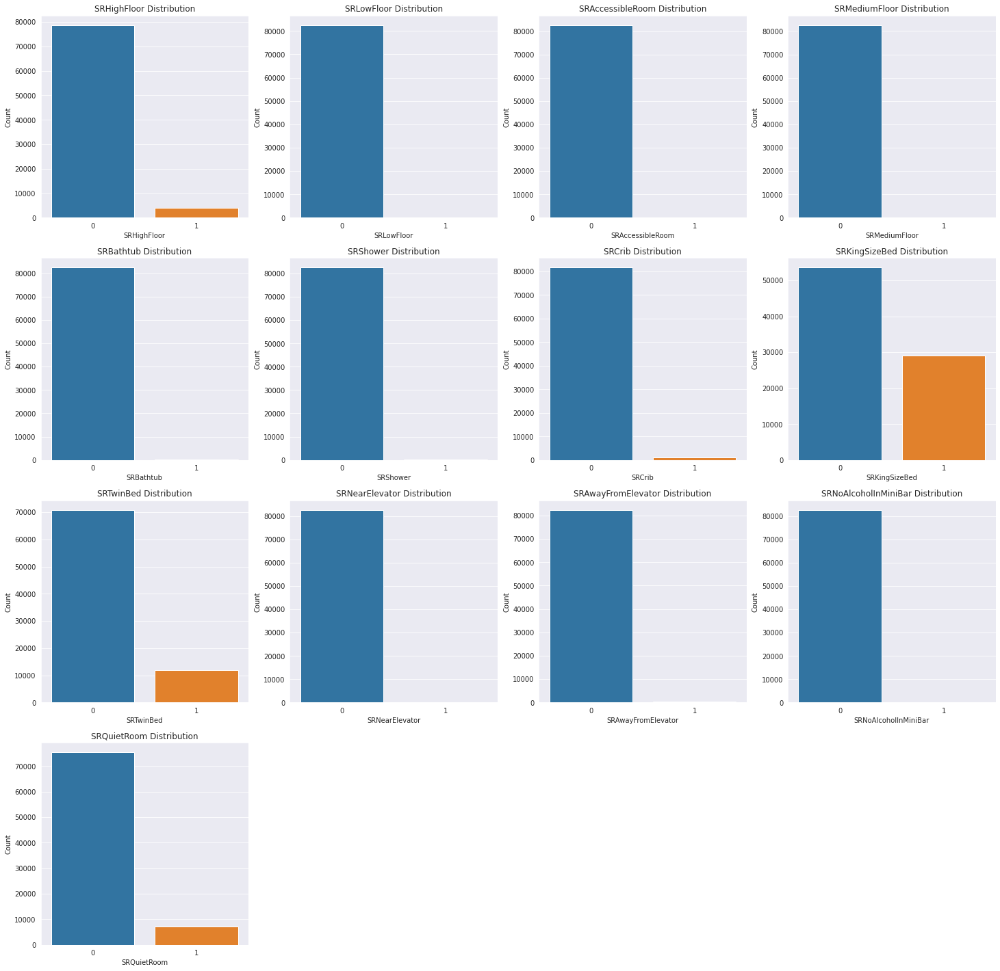

In [18]:
univariate_analysis(categorical_feat_1, 'category_1')

- Most asked for special requests are KingSizeBed(35%), TwinBed(16%), QuietRoom(10%), HighFloor(4%) and Crib(1%).
- Rest of the special requests are not much asked for.

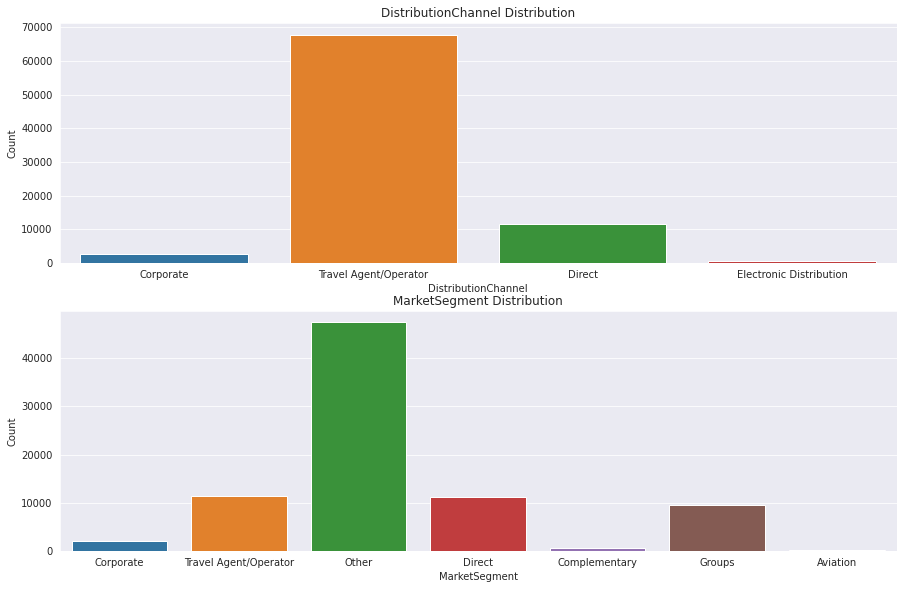

In [19]:
univariate_analysis(categorical_feat_2, 'category_2')

In [20]:
train['MarketSegment'].value_counts(normalize=True)

Other                    0.574679
Travel Agent/Operator    0.139041
Direct                   0.136571
Groups                   0.115052
Corporate                0.025854
Complementary            0.005861
Aviation                 0.002943
Name: MarketSegment, dtype: float64

**Distribution Channel in Hotel Indsutry**: A hotel distribution channel is anywhere — online or offline — that properties can sell rooms to potential customers

- 82% of the customers made a booking through Travel Agent 
- 14% of customers are direct meaning directly booking at the hotel

**Market Segment:** A market segment is a group of customers that have common characteristics: price sensitivity, booking channel, the purpose of travel, booking lead time, geographical region, length of stay, etc.

- 57% of customers belong to Other market segment
- 14% of customers are Travel Agents
- 13.6% are Direct
- 11% of the customers are in Groups

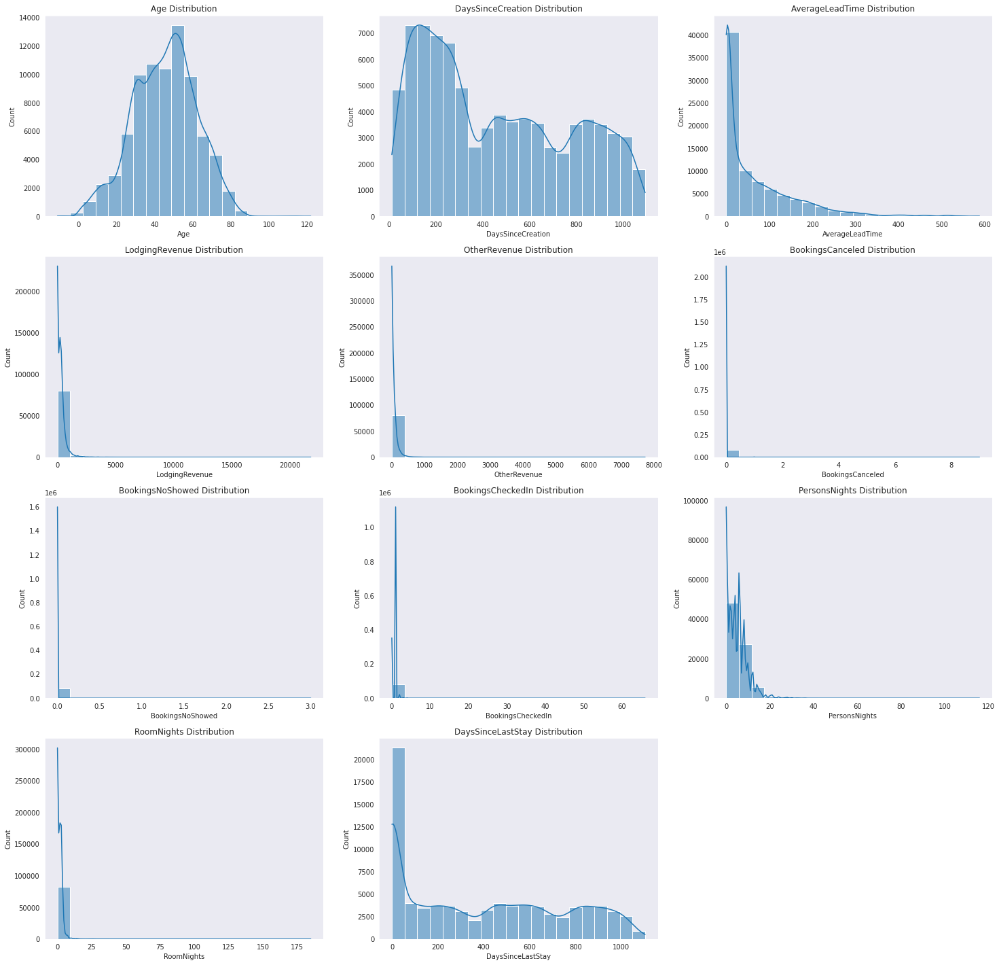

In [21]:
univariate_analysis(numerical_feat, 'number')

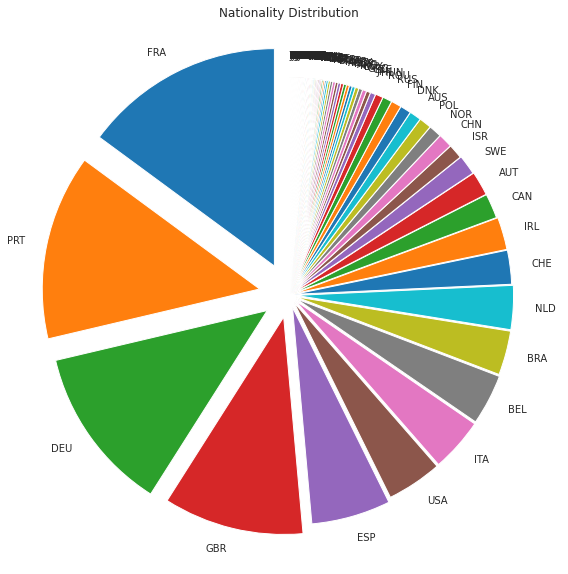

In [22]:
plt.figure(figsize=(10,10))
labels = train['Nationality'].value_counts().index.tolist()
y = (train['Nationality'].value_counts()*100/sum(train['Nationality'].value_counts())).tolist()
exp = (train['Nationality'].value_counts()/sum(train['Nationality'].value_counts())).tolist()
plt.pie(y, explode = exp, labels = labels, startangle=90)
plt.title('Nationality Distribution')
plt.show() 

In [23]:
train['Nationality'].value_counts(normalize=True)

FRA    0.149031
PRT    0.137830
DEU    0.123081
GBR    0.104263
ESP    0.058900
         ...   
GNQ    0.000012
GIN    0.000012
SWZ    0.000012
SOM    0.000012
NPL    0.000012
Name: Nationality, Length: 188, dtype: float64

- Most of the customers are from France(14%), Portugal(13%), Germany(12%) and UK(10%).


## Bivariate Analysis 
Objective: 
- Find a relation between independent features and dependent feature 
- Find a relation among independent features themselves

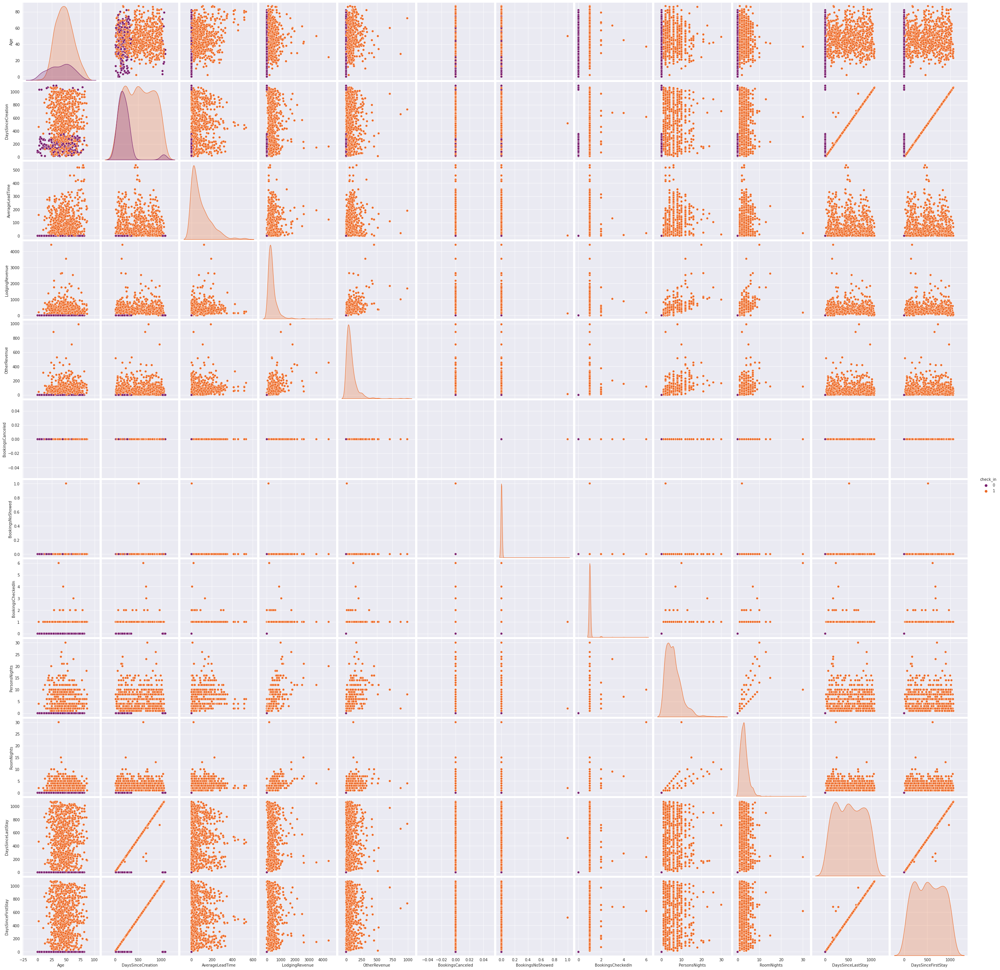

In [24]:
#pair plot for relation b/w numerical features
sns.pairplot(data=train[['Age', 'DaysSinceCreation', 'AverageLeadTime','LodgingRevenue', 'OtherRevenue', 'BookingsCanceled', 'BookingsNoShowed', 'BookingsCheckedIn', 'PersonsNights', 'RoomNights',
                         'DaysSinceLastStay', 'DaysSinceFirstStay', 'check_in']].sample(1000), hue='check_in', palette='inferno', height=3)
plt.show()

- Age and DaysSinceCreation are the only numerical features which show some relationship with one another.
- Rest of the features like LodgingRevenue, OtherRevenue, RoomNights, etc. directly indicate that the customer checked-in to the hotel therefore they must be dropped or else there is no need to build a model. 

In [25]:
def bivariate_analysis(data, feat1, feat2, hue, plot):
    
    sns.set_theme(style = 'darkgrid')
    plt.figure(figsize=(8,7))
    if plot=='scatter':
        if hue:
            ax = sns.scatterplot(data=data, x=feat1, y=feat2, hue='check_in', palette='Dark2')
        else:
            ax = sns.scatterplot(data=data, x=feat1, y=feat2, palette='Dark2')
        ax.set(xlabel = feat1, ylabel=feat2, title=feat1+' vs '+feat2)
        plt.grid()
    
    if plot=='box':
        if hue:
            ax = sns.boxplot(data=data, x =feat2, y=feat1, hue='check_in', palette='Dark2')
        else:
            ax = sns.boxplot(data=data, x =feat2, y=feat1, palette='Dark2')
        try:
            ax.set(xlabel=feat2, ylabel=feat1, title=feat1+' Distribution w.r.t '+feat2)
        except: 
            pass
        plt.grid('on')
        
    if plot=='violin':
        if hue:
            ax = sns.violinplot(data=data, x=feat2, y=feat1, hue = 'check_in', palette='Dark2')
        else:
            ax = sns.violinplot(data=data, x=feat2, y=feat1, palette='Dark2')
        try:
            ax.set(xlabel = feat2, ylabel=feat1, title=feat1+' Distribution w.r.t '+feat2)
        except: 
            pass
        plt.grid('on')
    
    if plot=='hist':
        ax = sns.histplot(data=data, x=feat1, hue=feat2, bins=20, kde=True, palette='Dark2')
        ax.set(xlabel = feat1, ylabel='Count', title= feat1+' Distribution w.r.t '+feat2)
        plt.grid('on')

    if plot=='count':
        ax = sns.countplot(data=data, x=feat1, hue=feat2, palette='Dark2')
        ax.set(xlabel = feat1, ylabel='Count', title= feat1+' Distribution w.r.t '+feat2)
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 50)
        plt.grid('on')
    
    return plt.show()

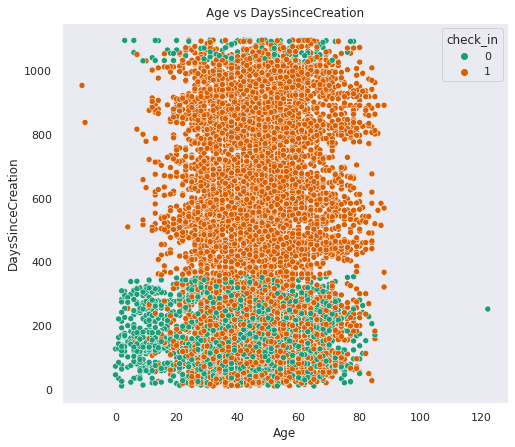

In [26]:
bivariate_analysis(train.sample(10000), 'Age', 'DaysSinceCreation', True, 'scatter')

In [27]:
train['DaysSinceFirstStay'].max()

1186

- A noteworthy observation to make here is that customers who have not checked in have been in the records since very recently <400 days or since a very early on >1000 days there's no in between.


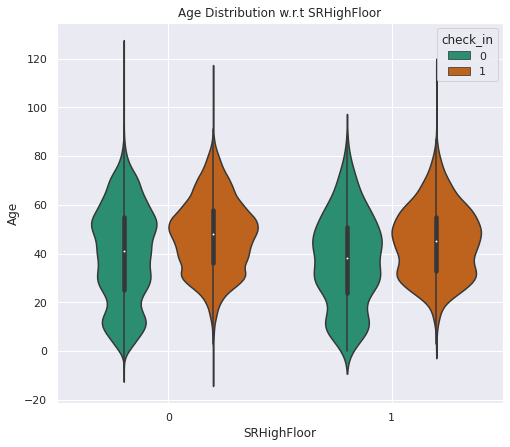

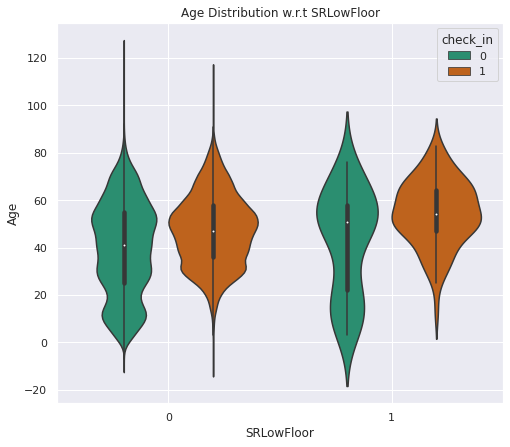

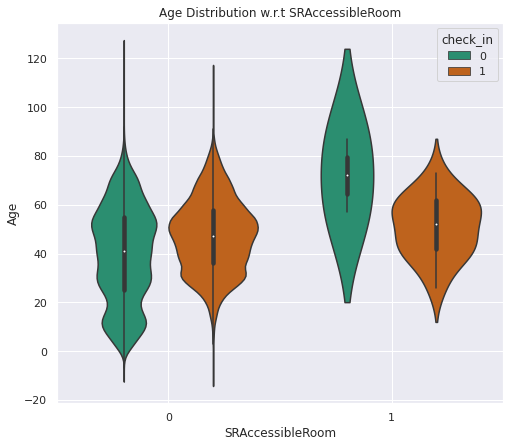

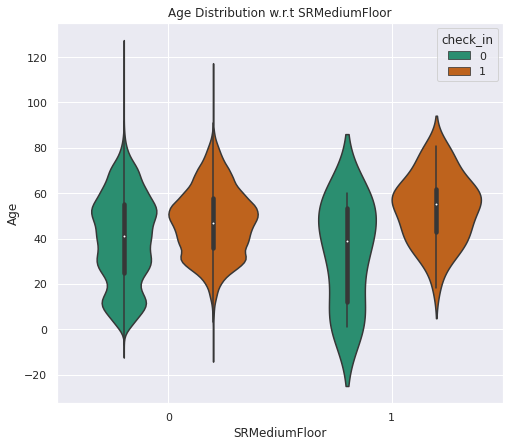

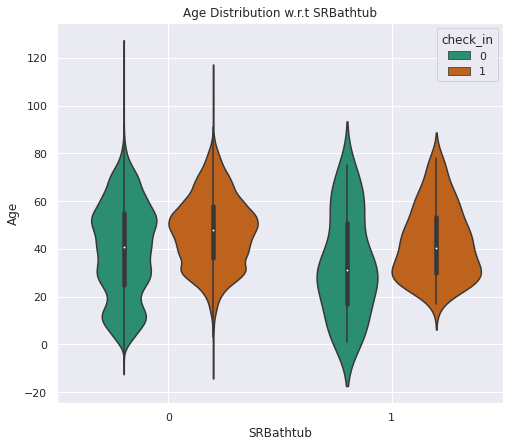

...

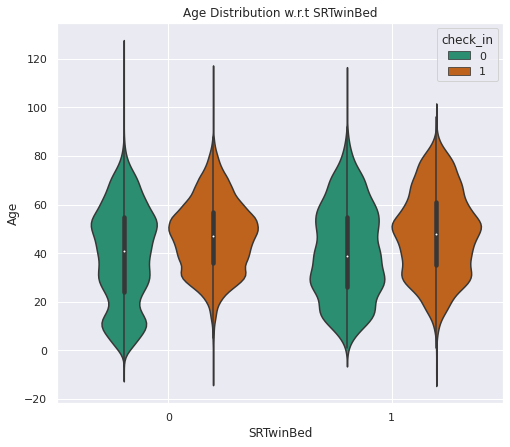

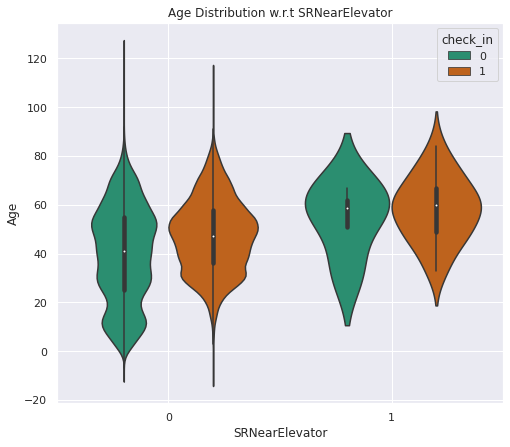

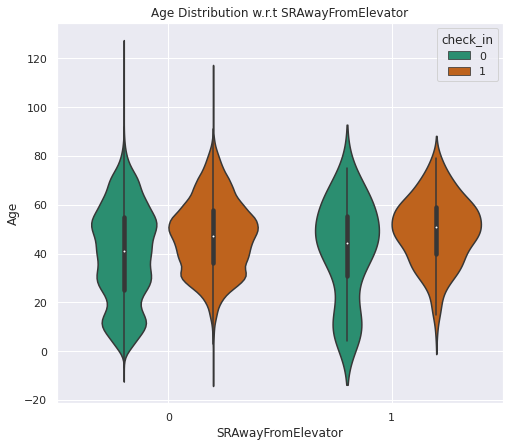

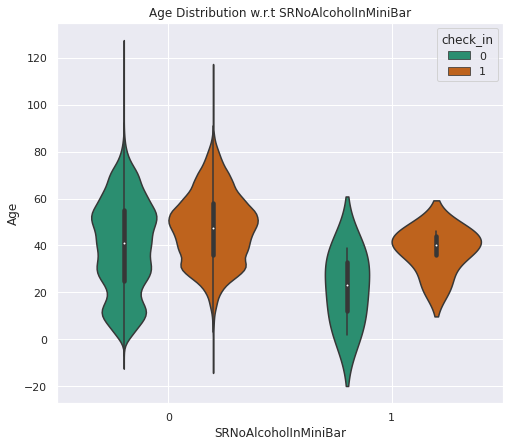

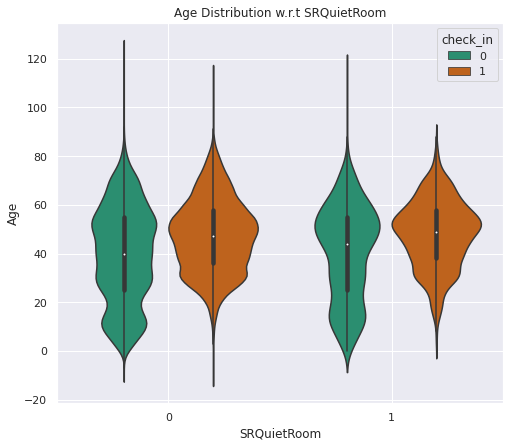

In [28]:
for cat in categorical_feat_1:
    bivariate_analysis(train, 'Age', cat, True, 'violin')

- Customers who asked for an accesible room but did not check in were mostly aged 70-80 years while those who made the same request and did check in were mostly aged 42-62 years.
- Customers who asked for a minibar but did not check in were mostly aged 15-32 years while those who made the same request and did check in were mostly aged 35-42 years.

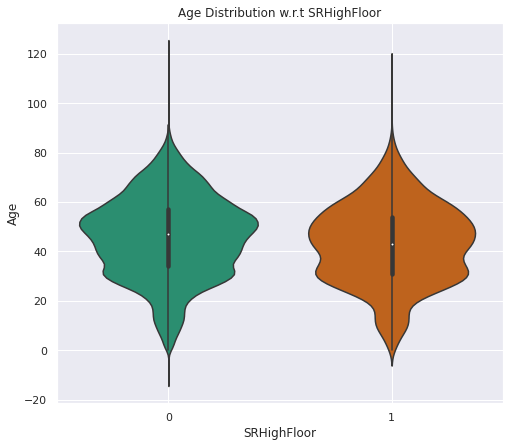

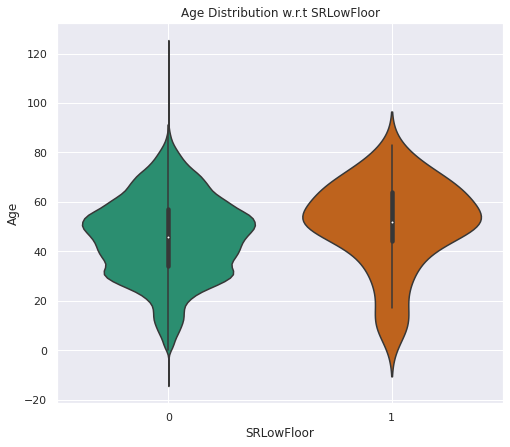

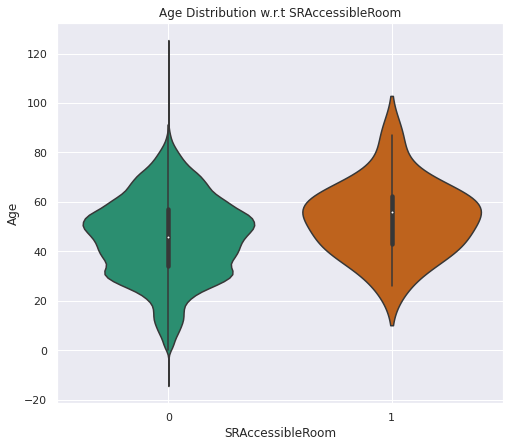

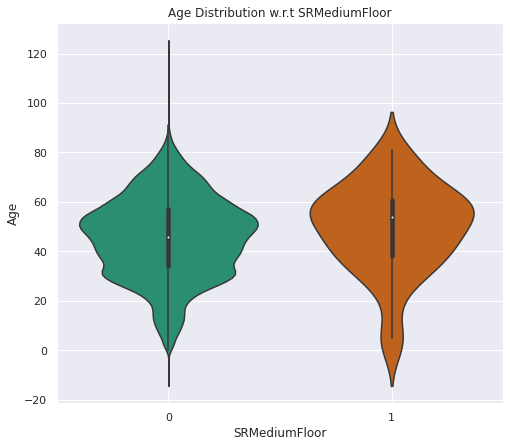

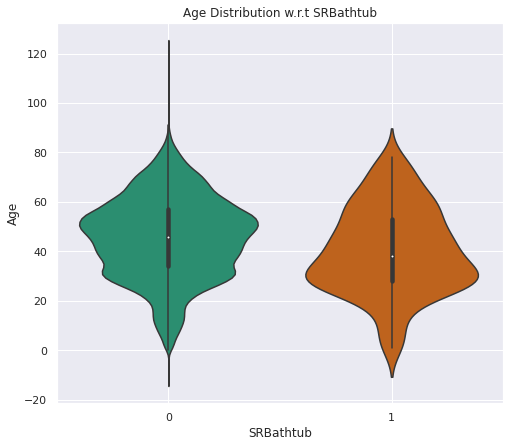

...

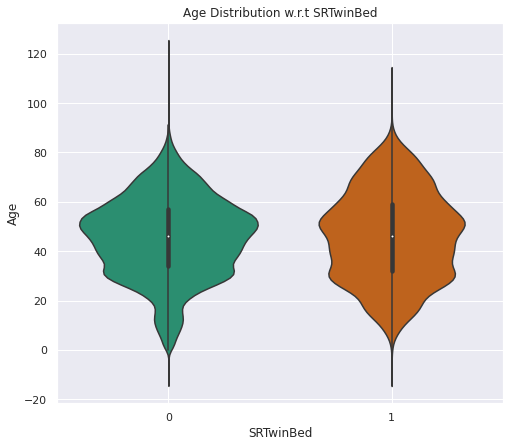

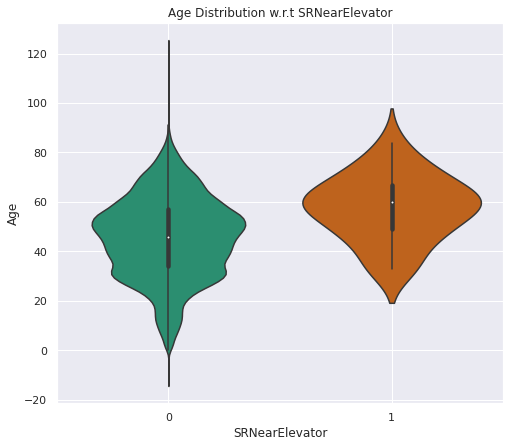

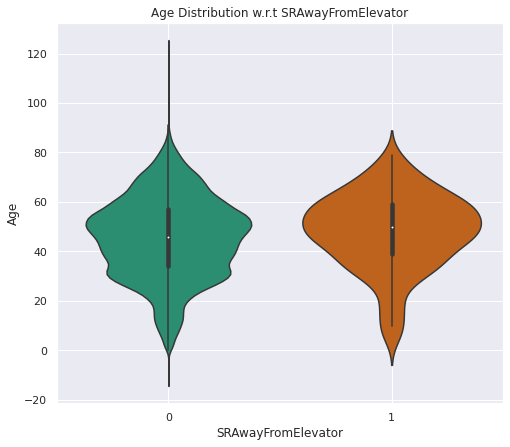

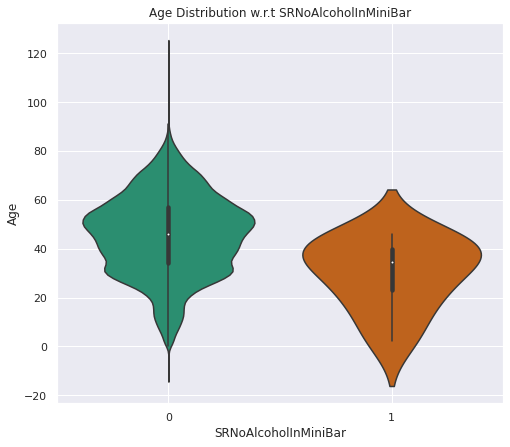

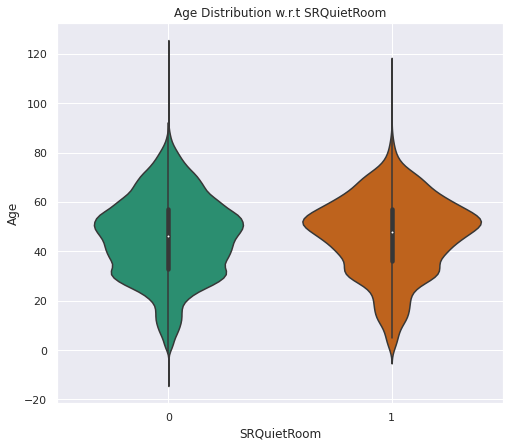

In [29]:
for cat in categorical_feat_1:
    bivariate_analysis(train, 'Age', cat, False, 'violin')

- In general, most Customers who asked for mini bar were on the lower end of the age spectrum 20-40 years
- In general, most Customers who asked for a crib were on the lower end of the age spectrum 9-40 years

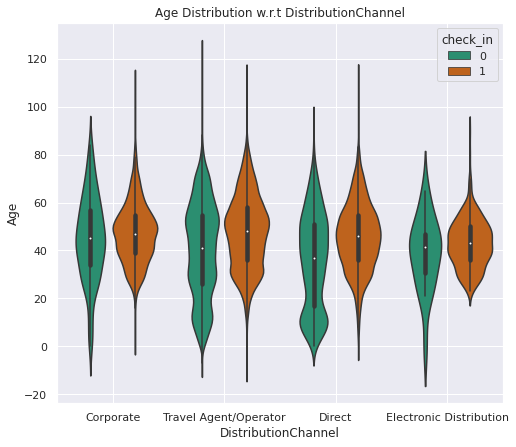

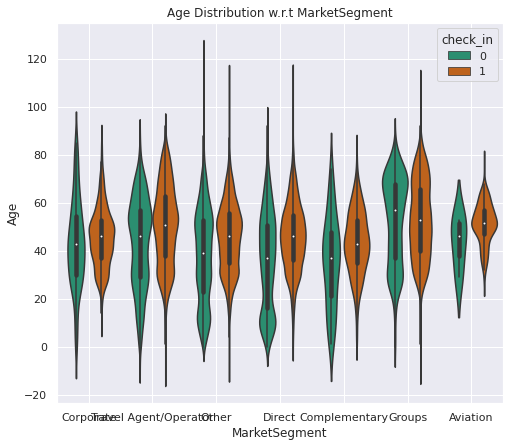

In [30]:
for cat in categorical_feat_2:
    bivariate_analysis(train, 'Age', cat, True, 'violin')

- less than 20 year old Customers through Travel Agent and Direct Distribution Channel who didn't check in 

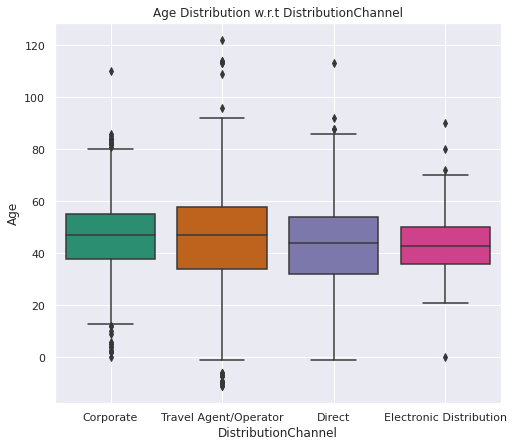

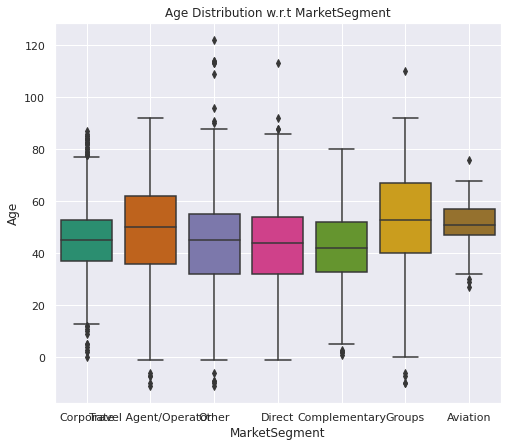

In [31]:
for cat in categorical_feat_2:
    bivariate_analysis(train, 'Age', cat, False, 'box')

- Not much of separability factor that can be seen here.

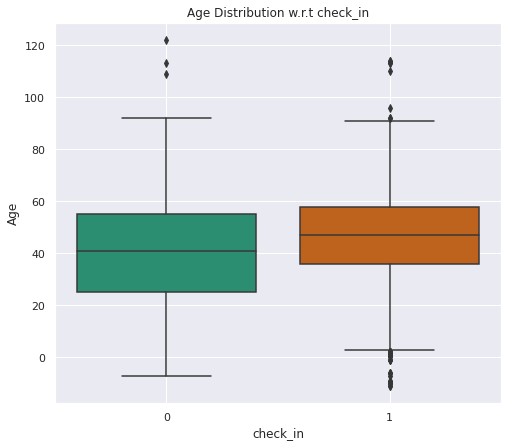

In [32]:
bivariate_analysis(train, 'Age', 'check_in', False, 'box')

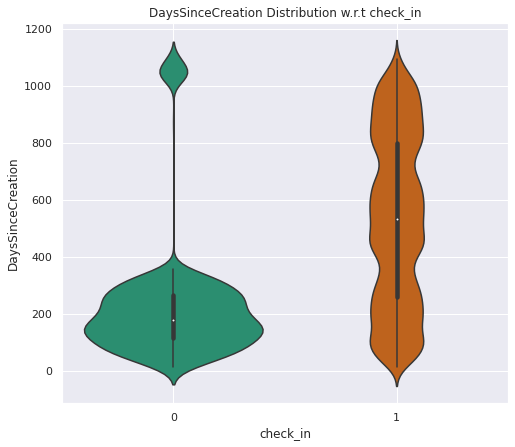

In [33]:
bivariate_analysis(train, 'DaysSinceCreation','check_in', False, 'violin')

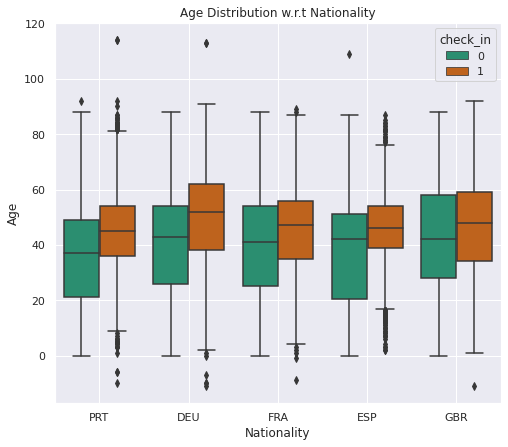

In [34]:
#Age vs Nationality (Top 5)
bivariate_analysis(train[(train['Nationality']=='FRA')| (train['Nationality']=='PRT') | (train['Nationality']=='DEU') | (train['Nationality']=='GBR') | (train['Nationality']== 'ESP')], 
                   'Age', 'Nationality',True, 'box')

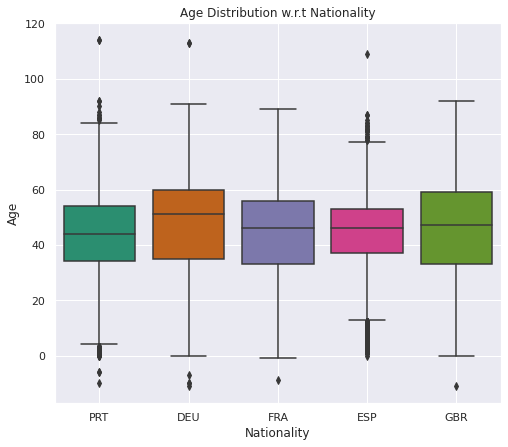

In [35]:
#Age vs Nationality (Top 5)
bivariate_analysis(train[(train['Nationality']=='FRA')| (train['Nationality']=='PRT') | (train['Nationality']=='DEU') | (train['Nationality']=='GBR') | (train['Nationality']== 'ESP')], 
                   'Age', 'Nationality',False, 'box')

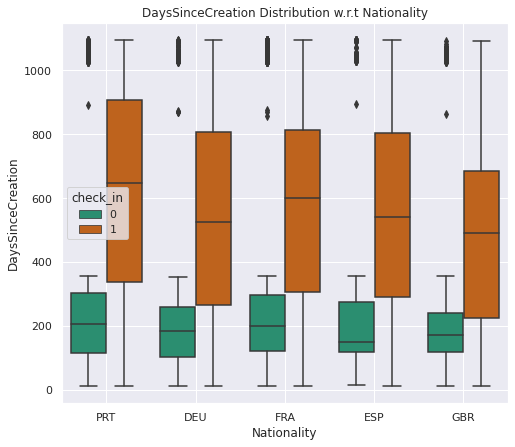

In [36]:
#DaysSinceCreation vs Nationality (Top 5)
bivariate_analysis(train[(train['Nationality']=='FRA')| (train['Nationality']=='PRT') | (train['Nationality']=='DEU') | (train['Nationality']=='GBR') | (train['Nationality']== 'ESP')], 
                   'DaysSinceCreation', 'Nationality',True, 'box')

- Most customer records that were created recently <1 year have not checked in.

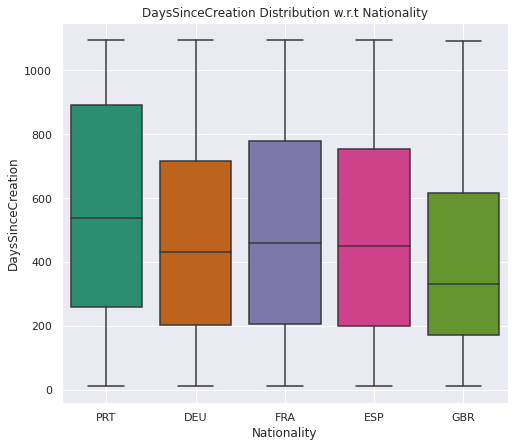

In [37]:
#DaysSinceCreation vs Nationality (Top 5)
bivariate_analysis(train[(train['Nationality']=='FRA')| (train['Nationality']=='PRT') | (train['Nationality']=='DEU') | (train['Nationality']=='GBR') | (train['Nationality']== 'ESP')], 
                   'DaysSinceCreation', 'Nationality',False, 'box')

In [38]:
train.columns

Index(['ID', 'Nationality', 'Age', 'DaysSinceCreation', 'AverageLeadTime',
       'LodgingRevenue', 'OtherRevenue', 'BookingsCanceled',
       'BookingsNoShowed', 'BookingsCheckedIn', 'PersonsNights', 'RoomNights',
       'DaysSinceLastStay', 'DaysSinceFirstStay', 'DistributionChannel',
       'MarketSegment', 'SRHighFloor', 'SRLowFloor', 'SRAccessibleRoom',
       'SRMediumFloor', 'SRBathtub', 'SRShower', 'SRCrib', 'SRKingSizeBed',
       'SRTwinBed', 'SRNearElevator', 'SRAwayFromElevator',
       'SRNoAlcoholInMiniBar', 'SRQuietRoom', 'check_in'],
      dtype='object')

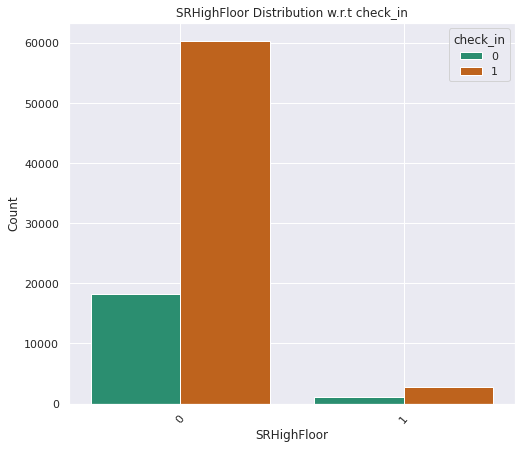

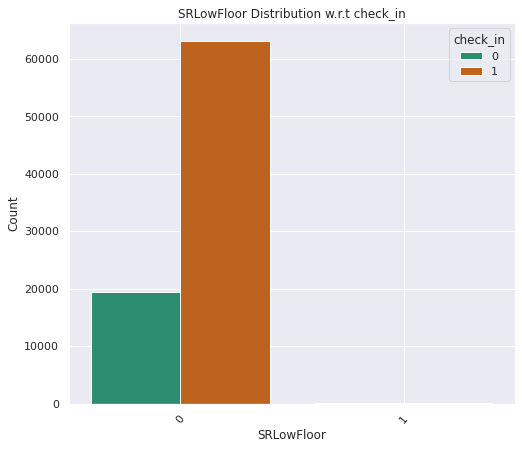

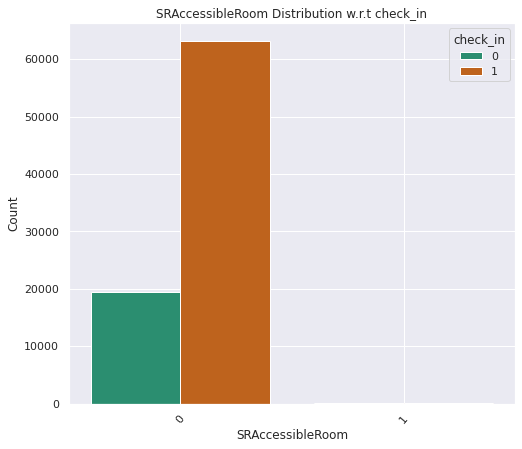

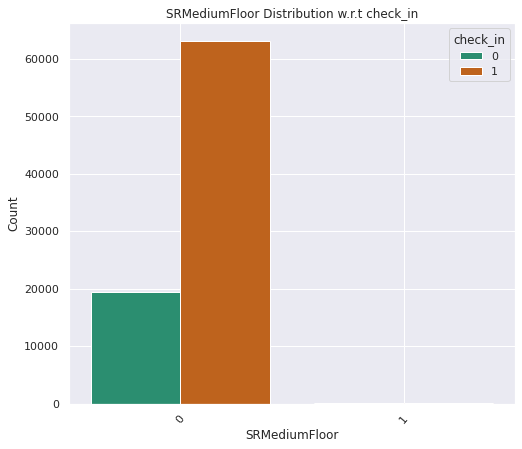

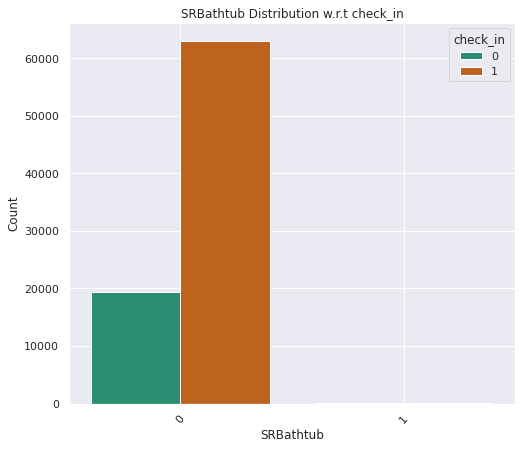

...

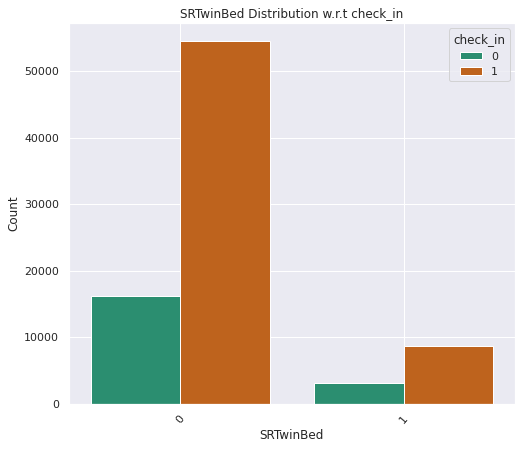

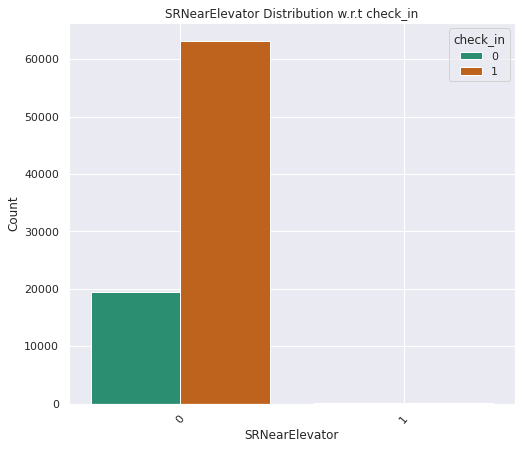

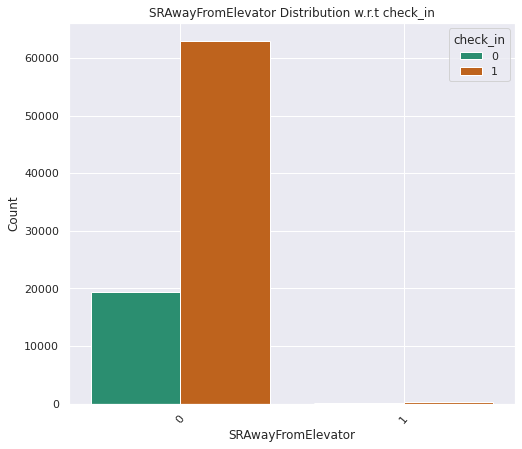

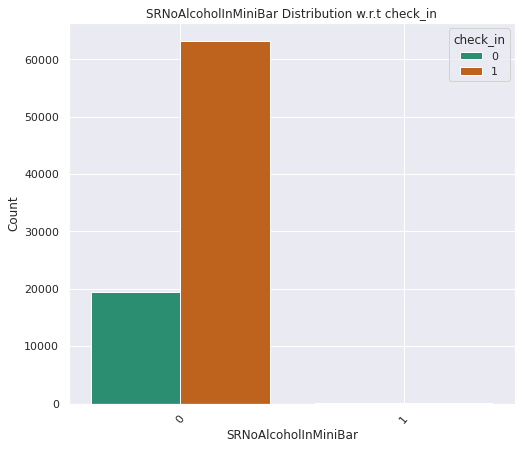

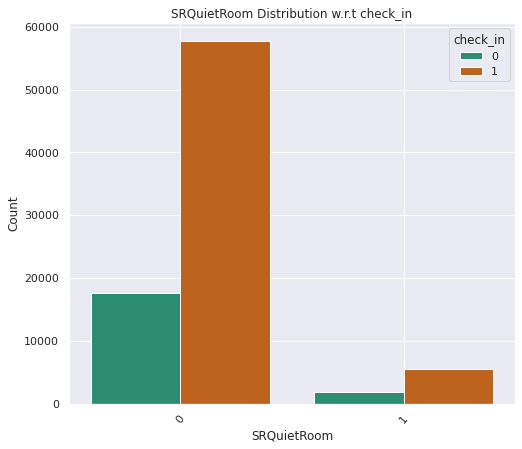

In [39]:
for cat in categorical_feat_1:
    bivariate_analysis(train, cat,'check_in', False, 'count')

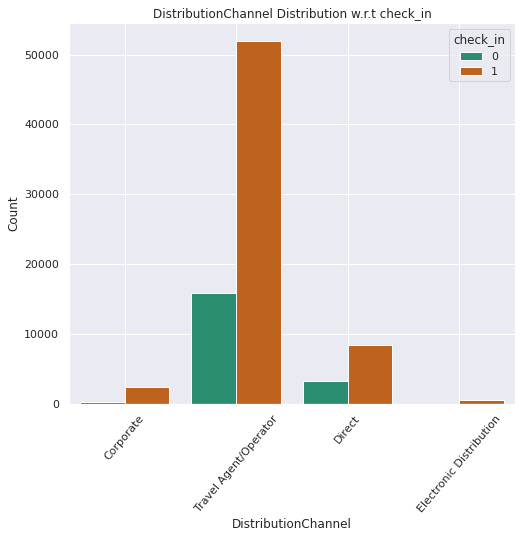

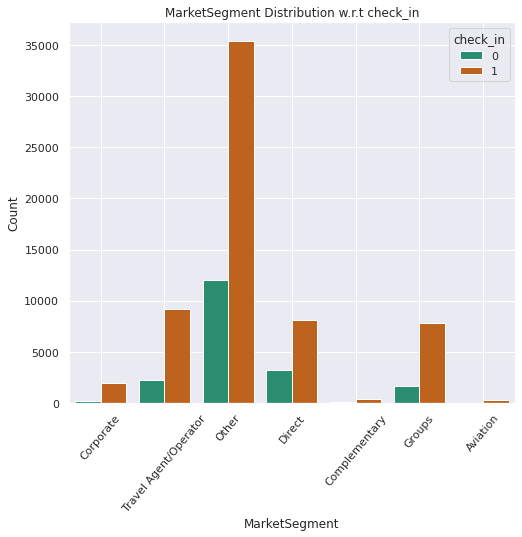

In [40]:
for cat in categorical_feat_2:
    bivariate_analysis(train, cat,'check_in', False, 'count')

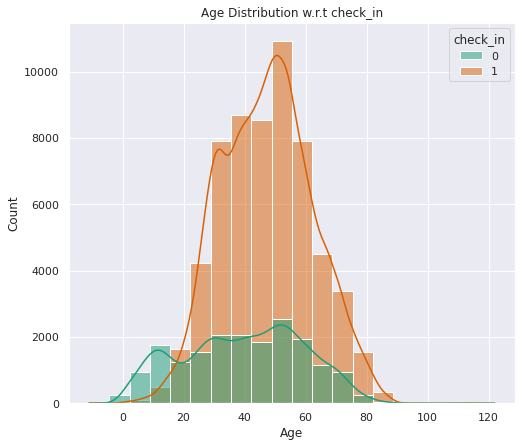

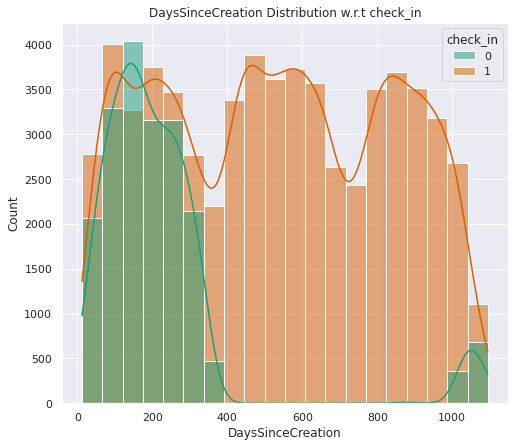

In [41]:
for num in ['Age', 'DaysSinceCreation']:
    bivariate_analysis(train, num,'check_in', False, 'hist')

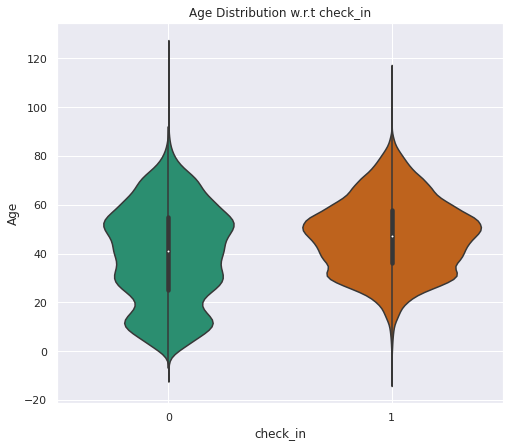

In [42]:
bivariate_analysis(train, 'Age','check_in', False, 'violin')

-  Customers aged >20 are mostly those who haven't checked in 

In [43]:
train[(train['DaysSinceCreation']>=500) & (train['DaysSinceCreation']<=800)]['check_in'].value_counts()

1    17849
Name: check_in, dtype: int64

- Customer records that were created between 500<x<800 days have 0 customers who have not checked in.

# 3. Data Cleaning 

## Treating Duplicates

In [44]:
#perform all the operations on the data copy 
df_train = train.copy()
df_test = test.copy()

In [45]:
df_train.drop(columns = ['ID'], inplace=True)
df_test.drop(columns = ['ID'], inplace=True)

In [46]:
df_train.drop_duplicates(keep='first', inplace=True, ignore_index=True)
df_test.drop_duplicates(keep='first', inplace=True, ignore_index=True)

##Treating Missing Values

In [47]:
df_train[np.isnan(df_train['Age'])]['Nationality'].value_counts()

PRT    3088
PAN       1
ESP       1
Name: Nationality, dtype: int64

In [48]:
df_test[np.isnan(df_test['Age'])]['Nationality'].value_counts()

PRT    24
Name: Nationality, dtype: int64

In [49]:
def impute_age(train, test):
    tr = train.copy()
    te = test.copy()
    countries = tr[np.isnan(tr['Age'])]['Nationality'].value_counts().index.tolist()
    for country in countries: 
        median_age = tr[(tr['Nationality'] == country) & (~np.isnan(tr['Age']))]['Age'].median()
        tr.loc[(tr['Nationality']==country) & (np.isnan(tr['Age'])), 'Age'] = median_age
        if country=='PRT':
            te.loc[(te['Nationality']==country) & (np.isnan(te['Age'])), 'Age'] = median_age
    return tr, te

def drop_nan(train, test):
    return train.dropna() ,test.dropna()

In [50]:
#We can use either of the methods but as of now we go ahead with median imputed data 
#median imputation
df_train_imputed, df_test_imputed = impute_age(df_train, df_test)

#drop missing values
df_train_drop, df_test_drop = drop_nan(df_train, df_test)

In [51]:
df_train_imputed.shape, df_test_imputed.shape

((80226, 29), (970, 29))

In [52]:
df_train_drop.shape, df_test_drop.shape

((77136, 29), (946, 29))

## Treating Outliers

In [53]:
def percentile_df(train, range):
    percentiles = np.arange(range[0], range[1], range[2])
    df = pd.DataFrame({'percentile':percentiles, 'age': np.percentile(train['Age'].values, percentiles)})
    return df

In [54]:
percentile_df(df_train_imputed, (0,110,10))

,percentile,age
0,0,-11.0
1,10,25.0
2,20,31.0
3,30,37.0
4,40,42.0
5,50,45.0
6,60,50.0
7,70,54.0
8,80,59.0
9,90,66.0


In [55]:
percentile_df(df_train_imputed, (0,11,1))

,percentile,age
0,0,-11.0
1,1,6.0
2,2,10.0
3,3,12.0
4,4,15.0
5,5,17.0
6,6,19.0
7,7,21.0
8,8,23.0
9,9,24.0


In [56]:
percentile_df(df_train_imputed, (0,1.1,0.1))

,percentile,age
0,0.0,-11.0
1,0.1,1.0
2,0.2,2.0
3,0.3,2.0
4,0.4,3.0
5,0.5,4.0
6,0.6,4.0
7,0.7,5.0
8,0.8,5.0
9,0.9,6.0


In [57]:
percentile_df(df_train_imputed, (90,101,1))

,percentile,age
0,90,66.0
1,91,67.0
2,92,68.0
3,93,69.0
4,94,70.0
5,95,71.0
6,96,73.0
7,97,75.0
8,98,77.0
9,99,80.0


In [58]:
percentile_df(df_train_imputed, (99,100.1,0.1))

,percentile,age
0,99.0,80.0
1,99.1,80.0
2,99.2,81.0
3,99.3,81.0
4,99.4,82.0
5,99.5,82.0
6,99.6,83.0
7,99.7,84.0
8,99.8,85.0
9,99.9,87.0


In [59]:
#choosing 0.1 and 99.9 percentile values
lower = 1
upper = 87

df_train_imputed = df_train_imputed[(df_train_imputed['Age']>=lower) & (df_train_imputed['Age']<=upper)]
df_test_imputed = df_test_imputed[(df_test_imputed['Age']>=lower) & (df_test_imputed['Age']<=upper)]

# 4. Feature Engineering

## Feature Extraction

In [60]:
#add a feature total special request made by the customer
df_train_imputed['TotalSR'] = df_train_imputed[['SRHighFloor', 'SRLowFloor', 'SRAccessibleRoom','SRMediumFloor', 'SRBathtub', 'SRShower', 'SRCrib', 'SRKingSizeBed',
                  'SRTwinBed', 'SRNearElevator', 'SRAwayFromElevator','SRNoAlcoholInMiniBar', 'SRQuietRoom']].sum(axis=1)
df_test_imputed['TotalSR'] = df_test_imputed[['SRHighFloor', 'SRLowFloor', 'SRAccessibleRoom','SRMediumFloor', 'SRBathtub', 'SRShower', 'SRCrib', 'SRKingSizeBed',
                  'SRTwinBed', 'SRNearElevator', 'SRAwayFromElevator','SRNoAlcoholInMiniBar', 'SRQuietRoom']].sum(axis=1)

In [ ]:
!pip install pycountry_convert

In [62]:
#add a continent feature derived from nationality
import pycountry_convert as pc
def get_continent_name(country_code):
    if country_code=='TMP':
        return 'AS'
    elif country_code=='ATA' or country_code=='ATF':
        return 'AN'
    elif country_code=='UMI':
        return 'NA'
    elif country_code=='PCN':
        return 'OC'
    else:
        alpha2 = pc.country_alpha3_to_country_alpha2(country_code)
        continent_name = pc.country_alpha2_to_continent_code(alpha2)
        return continent_name
    
df_train_imputed['Continent'] = df_train_imputed['Nationality'].apply(get_continent_name)
df_test_imputed['Continent'] = df_test_imputed['Nationality'].apply(get_continent_name)

In [63]:
#add a binary feature which says if the customer is from overseas
df_train_imputed['Overseas'] = df_train_imputed['Continent'].apply(lambda x: 0 if x=='EU' else 1)
df_test_imputed['Overseas'] = df_test_imputed['Continent'].apply(lambda x: 0 if x=='EU' else 1)

In [64]:
#add a binary feature which says if the customer is from Portugal or not (since Portugal is location of the hotel)
df_train_imputed['Countryman'] = df_train_imputed['Nationality'].apply(lambda x: 1 if x=='PRT' else 0)
df_test_imputed['Countryman'] = df_test_imputed['Nationality'].apply(lambda x: 1 if x=='PRT' else 0)

In [65]:
#add a binary feature which says if the customer is an adult or no
df_train_imputed['Adult'] = df_train_imputed['Age'].apply(lambda x: 1 if x>=18 else 0)
df_test_imputed['Adult'] = df_test_imputed['Age'].apply(lambda x: 1 if x>=18 else 0)

In [66]:
#add a feature which says categorizes the Customer's Age into : child, teen, young_adult, middle_aged, senior
def check_AgeGroup(age):
    age_groups = {'child':range(1,13), 'teen':range(13,18), 'young_adult': range(18,30), 'early_middle_aged': range(30,45), 
                  'late_middle_aged':range(45,65), 'old': range(65,100)}
    for k,v in age_groups.items():
        if age in v:
            return k
            
df_train_imputed['AgeGroup'] = df_train_imputed['Age'].apply(check_AgeGroup)
df_test_imputed['AgeGroup'] = df_test_imputed['Age'].apply(check_AgeGroup)

In [67]:
#add a feature which indicates how long back the customer record was added
def partition_DaysSinceCreation(x):
    if x<=365:
        val = 'within_year'
    elif x in range(366,731):
        val = 'more_than_year_ago' 
    else:
        val = 'more_than_3years_ago'
    return val

df_train_imputed['RecordCreatedSince'] = df_train_imputed['DaysSinceCreation'].apply(partition_DaysSinceCreation)
df_test_imputed['RecordCreatedSince'] = df_test_imputed['DaysSinceCreation'].apply(partition_DaysSinceCreation)

In [68]:
#add a feature which sums up Canceled and NoShowed, basically BookingsNotCheckedIn
df_train_imputed['BookingsNotCheckedIn'] = df_train_imputed[['BookingsNoShowed', 'BookingsCanceled']].sum(axis=1)
df_test_imputed['BookingsNotCheckedIn'] = df_test_imputed[['BookingsNoShowed', 'BookingsCanceled']].sum(axis=1)

In [69]:
#add an updated Nationality feature with only top 25 nations
top_10_nationality = df_train_imputed['Nationality'].value_counts(normalize=True).sort_values(ascending=False).index.tolist()[:10]

df_train_imputed['Nationality_Updated'] = df_train_imputed['Nationality'].apply(lambda x: x if x in top_10_nationality else 'other')
df_test_imputed['Nationality_Updated'] = df_test_imputed['Nationality'].apply(lambda x: x if x in top_10_nationality else 'other')

Performing analysis on new features

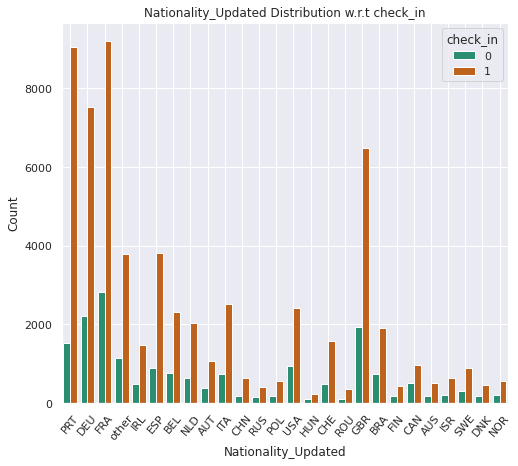

In [70]:
bivariate_analysis(df_train_imputed, 'Nationality_Updated','check_in', False, 'count')

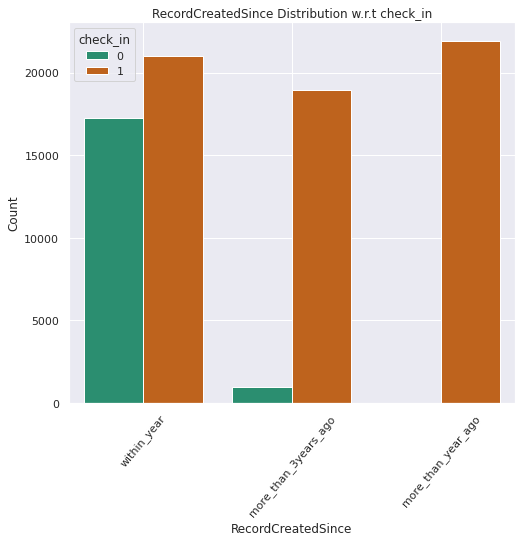

In [71]:
bivariate_analysis(df_train_imputed, 'RecordCreatedSince','check_in', False, 'count')

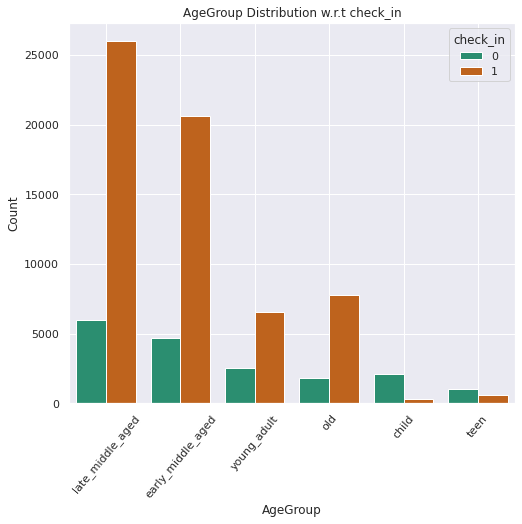

In [72]:
bivariate_analysis(df_train_imputed, 'AgeGroup','check_in', False, 'count')

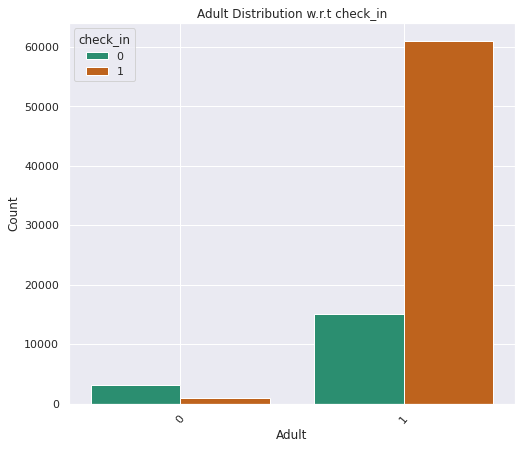

In [73]:
bivariate_analysis(df_train_imputed, 'Adult','check_in', False, 'count')

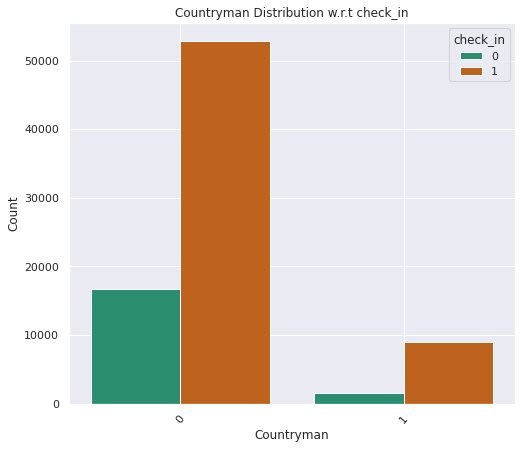

In [74]:
bivariate_analysis(df_train_imputed, 'Countryman','check_in', False, 'count')

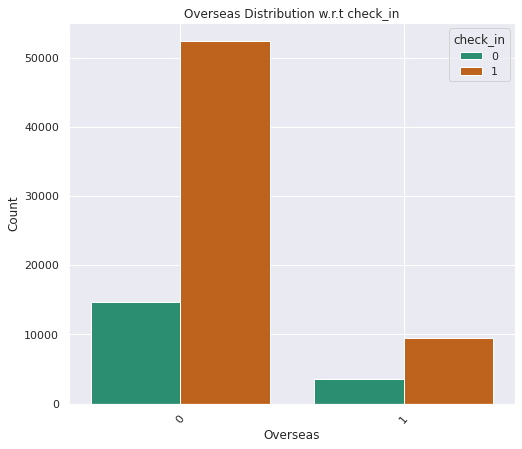

In [75]:
bivariate_analysis(df_train_imputed, 'Overseas','check_in', False, 'count')

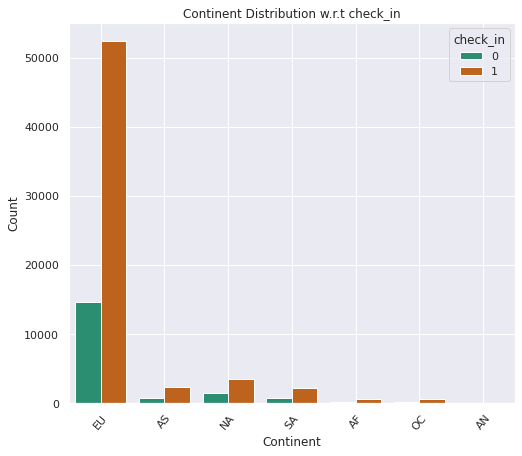

In [76]:
bivariate_analysis(df_train_imputed, 'Continent','check_in', False, 'count')

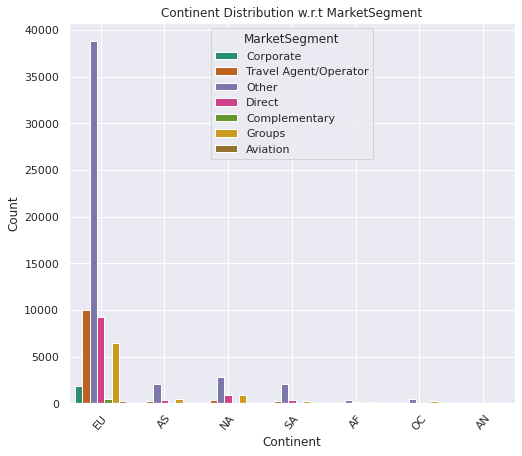

In [77]:
bivariate_analysis(df_train_imputed, 'Continent','MarketSegment', False, 'count')

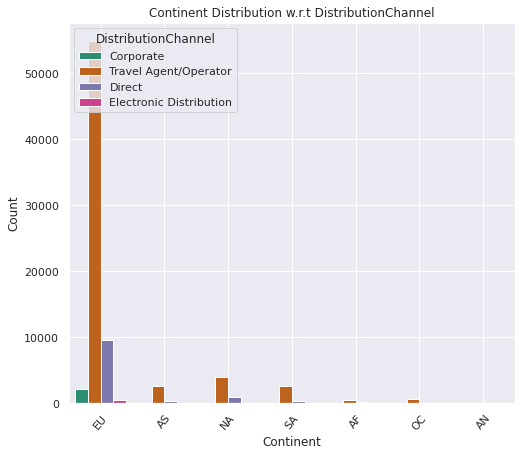

In [78]:
bivariate_analysis(df_train_imputed, 'Continent','DistributionChannel', False, 'count')

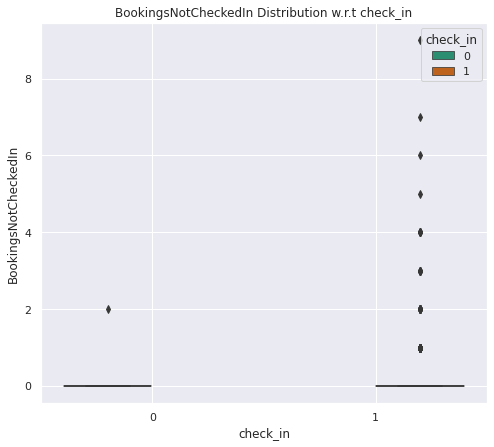

In [79]:
bivariate_analysis(df_train_imputed, 'BookingsNotCheckedIn','check_in', True, 'box')

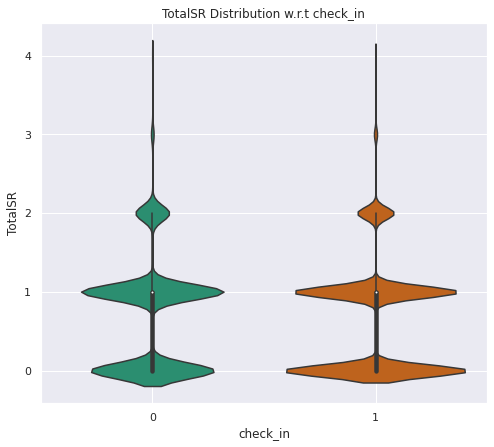

In [80]:
bivariate_analysis(df_train_imputed, 'TotalSR','check_in', False, 'violin')

In [81]:
#creating a temp df to check correlation between dummy variables
df_tmp = df_train_imputed.copy()
dummies = pd.get_dummies(df_tmp[['Continent', 'AgeGroup', 'RecordCreatedSince']], drop_first=True)
df_tmp = pd.concat([df_tmp.drop(['Continent', 'AgeGroup', 'RecordCreatedSince'],axis=1), dummies],axis=1)

## Feature Selection

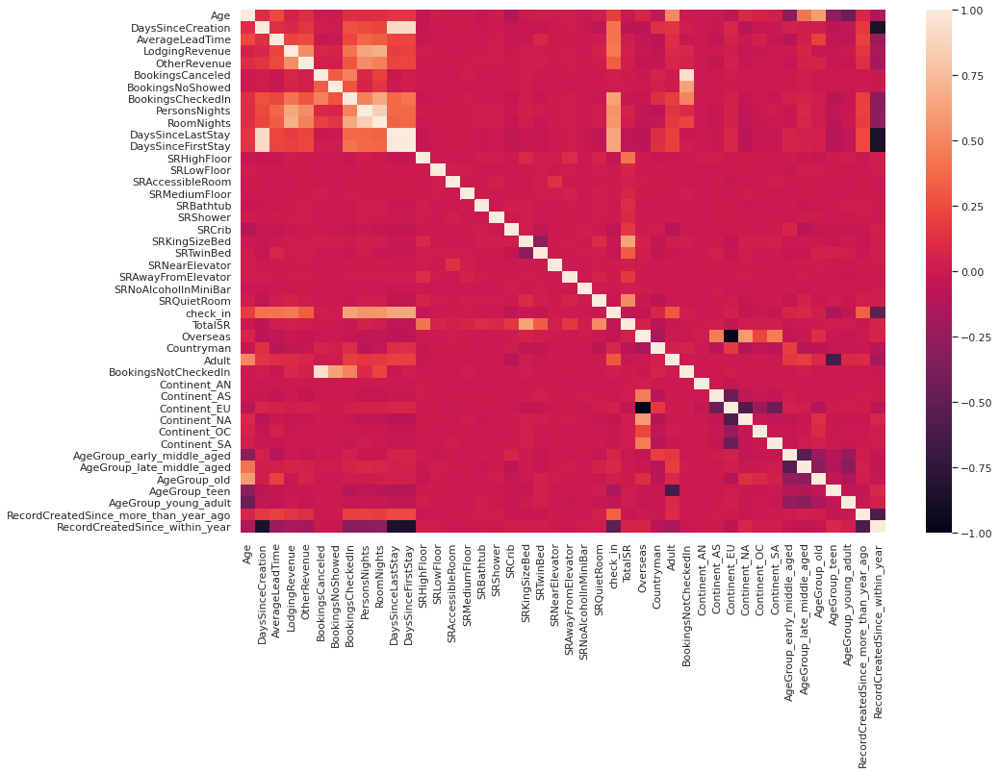

In [82]:
plt.figure(figsize=(15,10))
sns.heatmap(df_tmp.corr())
plt.show()

In [83]:
df_tmp.corr()['check_in'].sort_values(ascending=False)

check_in                                 1.000000
DaysSinceFirstStay                       0.646114
DaysSinceLastStay                        0.643777
BookingsCheckedIn                        0.625046
RoomNights                               0.568599
PersonsNights                            0.561478
LodgingRevenue                           0.440931
AverageLeadTime                          0.414709
DaysSinceCreation                        0.410609
RecordCreatedSince_more_than_year_ago    0.333137
OtherRevenue                             0.323730
Adult                                    0.303204
Age                                      0.192723
AgeGroup_late_middle_aged                0.079240
Countryman                               0.077484
AgeGroup_early_middle_aged               0.069267
Continent_EU                             0.044908
AgeGroup_old                             0.030376
BookingsNotCheckedIn                     0.017434
BookingsCanceled                         0.015906


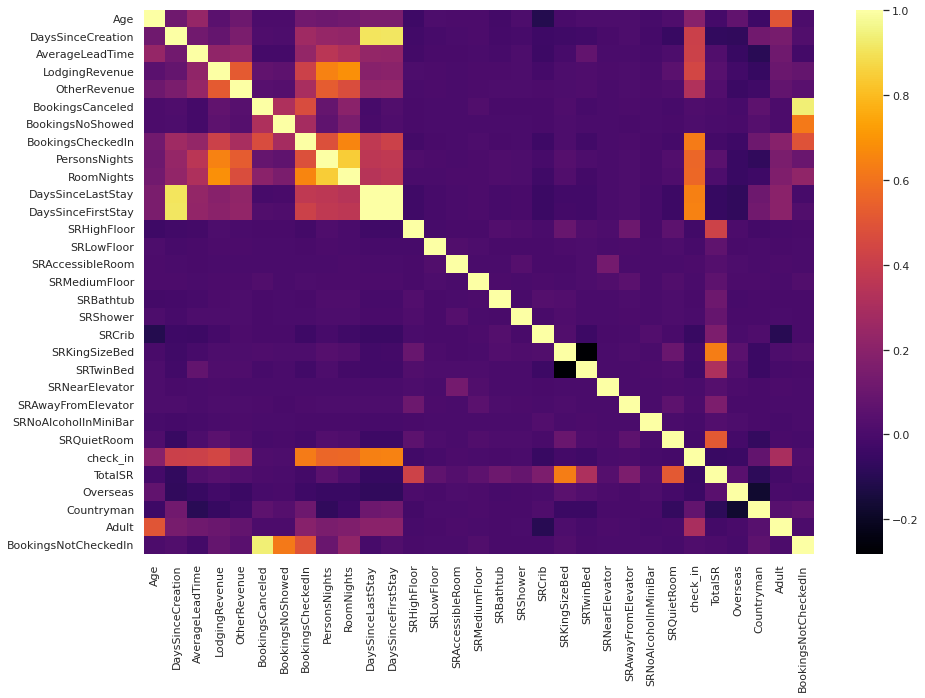

In [84]:
#check correlation between numerical variables
plt.figure(figsize=(15,10))
sns.heatmap(df_train_imputed.corr(), cmap='inferno')
plt.show()

In [85]:
df_train_imputed.corr()['check_in'].sort_values(ascending=False)

check_in                1.000000
DaysSinceFirstStay      0.646114
DaysSinceLastStay       0.643777
BookingsCheckedIn       0.625046
RoomNights              0.568599
PersonsNights           0.561478
LodgingRevenue          0.440931
AverageLeadTime         0.414709
DaysSinceCreation       0.410609
OtherRevenue            0.323730
Adult                   0.303204
Age                     0.192723
Countryman              0.077484
BookingsNotCheckedIn    0.017434
BookingsCanceled        0.015906
BookingsNoShowed        0.011892
SRAccessibleRoom        0.005105
SRAwayFromElevator      0.004748
SRNearElevator          0.002840
SRMediumFloor           0.001578
SRShower               -0.000341
SRBathtub              -0.006233
SRLowFloor             -0.007119
SRNoAlcoholInMiniBar   -0.007267
SRQuietRoom            -0.012379
SRKingSizeBed          -0.018432
SRHighFloor            -0.025939
SRTwinBed              -0.029266
Overseas               -0.044908
TotalSR                -0.049846
SRCrib    

In [86]:
from scipy.stats import chi2_contingency
# Assumption(H0): The two columns are NOT related to each other
# Alternate(H1): The two columns are related to each other
# if P-Value>0.05 then only accept null hypothesis else reject
cat_feat = ['Nationality', 'Nationality_Updated', 'AgeGroup', 'Continent', 'DistributionChannel', 'MarketSegment', 'check_in']

In [87]:
#check correlation between categorical variables and target using chi2 test 
for i in range(len(cat_feat)-1):
    crosstab_res = pd.crosstab(index=df_train_imputed[cat_feat[i]], columns=df_train_imputed[cat_feat[-1]])
    ChiSqResult = chi2_contingency(crosstab_res)

    print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
    if ChiSqResult[1]<=0.05:
        print(f'{cat_feat[i]} and {cat_feat[-1]} are related to each other\n')
    else:
        print(f'{cat_feat[i]} and {cat_feat[-1]} are not related to each other\n')

The P-Value of the ChiSq Test is: 8.730848540118247e-127
Nationality and check_in are related to each other

The P-Value of the ChiSq Test is: 4.626684150072596e-148
Nationality_Updated and check_in are related to each other

The P-Value of the ChiSq Test is: 0.0
AgeGroup and check_in are related to each other

The P-Value of the ChiSq Test is: 4.659738446816225e-47
Continent and check_in are related to each other

The P-Value of the ChiSq Test is: 3.574477523076281e-115
DistributionChannel and check_in are related to each other

The P-Value of the ChiSq Test is: 1.495190427379635e-169
MarketSegment and check_in are related to each other



In [88]:
df_train_imputed.columns

Index(['Nationality', 'Age', 'DaysSinceCreation', 'AverageLeadTime',
       'LodgingRevenue', 'OtherRevenue', 'BookingsCanceled',
       'BookingsNoShowed', 'BookingsCheckedIn', 'PersonsNights', 'RoomNights',
       'DaysSinceLastStay', 'DaysSinceFirstStay', 'DistributionChannel',
       'MarketSegment', 'SRHighFloor', 'SRLowFloor', 'SRAccessibleRoom',
       'SRMediumFloor', 'SRBathtub', 'SRShower', 'SRCrib', 'SRKingSizeBed',
       'SRTwinBed', 'SRNearElevator', 'SRAwayFromElevator',
       'SRNoAlcoholInMiniBar', 'SRQuietRoom', 'check_in', 'TotalSR',
       'Continent', 'Overseas', 'Countryman', 'Adult', 'AgeGroup',
       'RecordCreatedSince', 'BookingsNotCheckedIn', 'Nationality_Updated'],
      dtype='object')

- Features like 'AverageLeadTime' 'LodgingRevenue', 'OtherRevenue', 'BookingsCheckedIn', 'PersonsNights', 'RoomNights', 'DaysSinceLastStay', 'DaysSinceFirstStay' can be removed because these features directly indicate if the person has ever checked in the hotel or not.
- Basically, we are removing all the features which gives us details regarding the stay at the hotel.
- So we must let go of these features to create a dataset on which we can build machine learning models.
- Rest of the features give information about the booking details and the customer demographic details. 

In [89]:
df_train_final = df_train_imputed.drop(columns = ['AverageLeadTime', 'LodgingRevenue', 'OtherRevenue', 'BookingsCheckedIn', 'PersonsNights', 'RoomNights', 'DaysSinceLastStay', 
                    'DaysSinceFirstStay'])
df_test_final = df_test_imputed.drop(columns = ['AverageLeadTime', 'LodgingRevenue', 'OtherRevenue', 'BookingsCheckedIn', 'PersonsNights', 'RoomNights', 'DaysSinceLastStay', 
                    'DaysSinceFirstStay'])

df_train_final.reset_index(drop=True, inplace=True)
df_test_final.reset_index(drop=True, inplace=True)

## Feature Encoding and Scaling

In [90]:
#categorical feature encoding
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder

def encoder(train, test, feat, type):
    if type == 'ohe':
        enc = OneHotEncoder(handle_unknown='ignore')
        onehot_train = enc.fit_transform(train[feat].values.reshape(-1,1))
        onehot_test = enc.transform(test[feat].values.reshape(-1,1))
        return onehot_train, onehot_test
    elif type == 'ordinal':
        enc = OrdinalEncoder(handle_unknown = 'use_encoded_value', unknown_value = -1)
        ordinal_train = enc.fit_transform(train[feat].values.reshape(-1,1))
        ordinal_test = enc.transform(test[feat].values.reshape(-1,1))
        return ordinal_train, ordinal_test

In [91]:
#numerical feature scaling 
from sklearn.preprocessing import Normalizer

def normalize(train, test, feat):
    norm = Normalizer()

    l2_norm = np.linalg.norm(train[feat].values)
    normalized_train = norm.fit_transform(train[feat].values.reshape(1,-1))
    normalized_test = test[feat].values.reshape(1, -1)/l2_norm 
    return normalized_train.reshape(-1,1), normalized_test.reshape(-1,1)

In [92]:
from imblearn.over_sampling import SMOTENC
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler 
from imblearn.under_sampling import TomekLinks
from scipy.sparse import hstack
import random 

def upsampling(X, y, index_cat_features):
    sm = SMOTENC(random_state=42, categorical_features=index_cat_features, n_jobs=-1) #np.arange(0,22,1)
    X_up, y_up = sm.fit_resample(X, y)
    return X_up, y_up

def downsampling(X, y):
    rus = RandomUnderSampler(random_state=42)
    X_down, y_down = rus.fit_resample(X, y)
    return X_down, y_down

def custom_downsampling(X, y, test):

    keep_idx_0 = random.sample(test[test['check_in']==0].index.tolist(), 140)
    X_0 = X[keep_idx_0,:]
    y_0 = y[keep_idx_0]

    keep_idx_1 = test[test['check_in']==1].index.tolist()
    X_1 = X[keep_idx_1,:]
    y_1 = y[keep_idx_1]

    X_down = np.vstack([X_0, X_1])
    y_down = np.hstack([y_0, y_1])
    return X_down, y_down

In [93]:
def prepare_data(train, test, encoding, distribution, train_sampling):
    binary_cat = [x for x in train.columns if x!='check_in' and len(np.unique(train[x]))==2]
    other_cat = [x for x in train.columns if x!='Nationality_Updated' and train[x].dtype=='O']
    num_feat = [x for x in train.columns if (train[x].dtype=='int' or train[x].dtype=='float') and x not in binary_cat+['check_in']]
    
    feature_order = other_cat+binary_cat+num_feat

    train_binary_cat = [train[binary_cat].values]
    train_other_cat = []
    train_num_feat = []

    test_binary_cat = [test[binary_cat].values]
    test_other_cat = []
    test_num_feat = []

    for cat in other_cat:
        train_cat, test_cat =  encoder(train, test, cat, encoding)
        train_other_cat.append(train_cat)
        test_other_cat.append(test_cat)

    for num in num_feat:
        train_num, test_num = normalize(train, test, num)
        train_num_feat.append(train_num)
        test_num_feat.append(test_num)
    
    if encoding=='ohe':
        X_train = hstack(train_other_cat + train_binary_cat + train_num_feat).toarray()
        X_test = hstack(test_other_cat + test_binary_cat + test_num_feat).toarray()
    else:
        X_train = np.hstack(train_other_cat + train_binary_cat + train_num_feat)
        X_test = np.hstack(test_other_cat + test_binary_cat + test_num_feat)
    
    y_train = train['check_in'].values
    y_test =  test['check_in'].values

    if distribution:
        if distribution == 'balanced':
            if train_sampling == 'up':
                X_train, y_train = upsampling(X_train, y_train, index_cat_features = np.arange(0, (X_train.shape[1]-len(num_feat)),1))
            elif train_sampling == 'down':
                X_train, y_train = downsampling(X_train, y_train)

            X_test, y_test = downsampling(X_test, y_test)
            return X_train, X_test, y_train, y_test, feature_order

        elif distribution == 'train':
            X_test, y_test = custom_downsampling(X_test, y_test, df_test_final)
            return X_train, X_test, y_train, y_test, feature_order
    
    return X_train, X_test, y_train, y_test, feature_order

In [94]:
def shuffle_data(X,y):
    zipped = list(zip(X, y))
    random.shuffle(zipped)
    X, y = list(zip(*zipped))
    return np.array(X),  np.array(y)

In [95]:
X_train, X_test, y_train, y_test, features = prepare_data(train = df_train_final, test = df_test_final, encoding = 'ohe', distribution = 'balanced', train_sampling = 'down')
X_train, y_train = shuffle_data(X_train, y_train)
X_test, y_test = shuffle_data(X_test, y_test)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(36436, 236) (952, 236) (36436,) (952,)


In [96]:
X_train_2, X_test_2, y_train_2, y_test_2, features = prepare_data(train = df_train_final, test = df_test_final, encoding = 'ohe', distribution = 'train', train_sampling = None)
X_train_2, y_train_2 = shuffle_data(X_train_2, y_train_2)
X_test_2, y_test_2 = shuffle_data(X_test_2, y_test_2)
print(X_train_2.shape, X_test_2.shape, y_train_2.shape, y_test_2.shape)

(80119, 236) (616, 236) (80119,) (616,)


In [97]:
X_train_3, X_test_3, y_train_3, y_test_3, features = prepare_data(train = df_train_final, test = df_test_final, encoding = 'ordinal', distribution = 'balanced', train_sampling = 'down')
X_train_3, y_train_3 = shuffle_data(X_train_3, y_train_3)
X_test_3, y_test_3 = shuffle_data(X_test_3, y_test_3)
print(X_train_3.shape, X_test_3.shape, y_train_3.shape, y_test_3.shape)

(36436, 28) (952, 28) (36436,) (952,)


In [98]:
X_train_4, X_test_4, y_train_4, y_test_4, features = prepare_data(train = df_train_final, test = df_test_final, encoding = 'ordinal', distribution = 'train', train_sampling = None)
X_train_4, y_train_4 = shuffle_data(X_train_4, y_train_4)
X_test_4, y_test_4 = shuffle_data(X_test_4, y_test_4)
print(X_train_4.shape, X_test_4.shape, y_train_4.shape, y_test_4.shape)

(80119, 28) (616, 28) (80119,) (616,)


In [ ]:
features

['Nationality',
 'DistributionChannel',
 'MarketSegment',
 'Continent',
 'AgeGroup',
 'RecordCreatedSince',
 'SRHighFloor',
 'SRLowFloor',
 'SRAccessibleRoom',
 'SRMediumFloor',
 'SRBathtub',
 'SRShower',
 'SRCrib',
 'SRKingSizeBed',
 'SRTwinBed',
 'SRNearElevator',
 'SRAwayFromElevator',
 'SRNoAlcoholInMiniBar',
 'SRQuietRoom',
 'Overseas',
 'Countryman',
 'Adult',
 'Age',
 'DaysSinceCreation',
 'BookingsCanceled',
 'BookingsNoShowed',
 'TotalSR',
 'BookingsNotCheckedIn']

In [99]:
#in case if the distribution is imbalanced we can use class weight dict
from sklearn.utils.class_weight import compute_class_weight
def get_class_weights(y):
    class_weight_arr = compute_class_weight('balanced', classes=np.unique(y), y=y)
    class_weight_dict = dict(zip(np.unique(y), class_weight_arr))
    return class_weight_dict

# 6. Model Building

Trying out Models with different data:

onehot encoded
- try with balanced class distribution data (X_train, y_train)
- try with imbalanced class distribution data (X_train_2, y_train_2)

ordinal encoded
- try with balanced class distribution (X_train_3, y_train_3)
- try with imbalanced class distribution (X_train_4, y_train_4)

## Baseline

In [100]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, f1_score

def model_evaluation(model, X_train, y_train, metric):
    model_cv = cross_val_score(model, X_train, y_train, cv = StratifiedKFold(n_splits = 5), scoring = metric)
    return model_cv

def compare_baseline_classifiers(X_train, X_test, y_train, y_test, metric):

    class_w_dict = get_class_weights(y_train)

    knn = KNeighborsClassifier()
    logreg = LogisticRegression(class_weight = class_w_dict, solver='sag', random_state=42)
    tree = DecisionTreeClassifier(class_weight = class_w_dict, max_depth = 32, random_state = 42)
    
    knn_cv = model_evaluation(knn,X_train,y_train, metric)
    logreg_cv = model_evaluation(logreg,X_train,y_train, metric)
    tree_cv = model_evaluation(tree, X_train,y_train, metric)

    for model in [knn, logreg, tree]:
        model.fit(X_train, y_train)
    
    score_mean = [knn_cv.mean(), logreg_cv.mean(), tree_cv.mean()] 
    score_std = [knn_cv.std(), logreg_cv.std(), tree_cv.std()] 

    test_f1_score = [f1_score(y_test, knn.predict(X_test)), f1_score(y_test, logreg.predict(X_test)), f1_score(y_test, tree.predict(X_test))]
    test_precision_score = [precision_score(y_test, knn.predict(X_test)), precision_score(y_test, logreg.predict(X_test)), recall_score(y_test, tree.predict(X_test))] 
    test_recall_score = [recall_score(y_test, knn.predict(X_test)), recall_score(y_test, logreg.predict(X_test)), recall_score(y_test, tree.predict(X_test))] 
    test_accuracy_score = [accuracy_score(y_test, knn.predict(X_test)), accuracy_score(y_test, logreg.predict(X_test)), accuracy_score(y_test, tree.predict(X_test))]
    test_auc_score = [roc_auc_score(y_test, knn.predict_proba(X_test)[:,1]), roc_auc_score(y_test, logreg.predict_proba(X_test)[:,1]), roc_auc_score(y_test, tree.predict_proba(X_test)[:,1])]

    method_name = ['KNeighbors Classifier', 'Logistic Regression', 'Decision Tree Classifier'] 
    cv_summary = pd.DataFrame({
    'method': method_name,
    'score_mean': score_mean,
    'score_std': score_std,
    'test_f1': test_f1_score,
    'test_precision_score': test_precision_score,
    'test_recall_score': test_recall_score,
    'test_accuracy_score':test_accuracy_score,
    'test_auc_score':test_auc_score
    })
    return cv_summary

In [ ]:
#balanced data 
compare_baseline_classifiers(X_train, X_test, y_train, y_test, 'accuracy')

,method,score_mean,score_std,test_f1,test_precision_score,test_recall_score,test_accuracy_score,test_auc_score
0,KNeighbors Classifier,0.785624,0.003572,0.296417,0.65942,0.191176,0.546218,0.617629
1,Logistic Regression,0.808102,0.001103,0.109589,0.80000,0.058824,0.522059,0.647990
2,Decision Tree Classifier,0.774399,0.009311,0.500585,0.44958,0.449580,0.551471,0.555805


- Since this is balanced data we will consider the accuracy scores which indicate that KNN and DTrees outperform LogReg and could be further build upon for better performance.

In [ ]:
#imbalanced data
compare_baseline_classifiers(X_train_2, X_test_2, y_train_2, y_test_2, 'f1')

,method,score_mean,score_std,test_f1,test_precision_score,test_recall_score,test_accuracy_score,test_auc_score
0,KNeighbors Classifier,0.853464,0.001633,0.716804,0.813333,0.640756,0.608766,0.602956
1,Logistic Regression,0.799273,0.001586,0.106509,0.870968,0.056723,0.264610,0.642024
2,Decision Tree Classifier,0.824620,0.003596,0.589168,0.468487,0.468487,0.495130,0.528106


- Since this is imbalanced data we will consider the f1 scores which indicates that KNN outperforms the other 2 and could be further build upon for better performance.

## XGBoost

- So we're clear how our baseline classifiers perform, we can use build upon these or use better algorithms and take their performances as a reference. 
- Next we opt to directly go for GBDT.

In [101]:
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
import tensorflow as tf
#check if gpu is enabled
tf.test.gpu_device_name()

'/device:GPU:0'

In [102]:
pos_class_weight = np.unique(y_train_2, return_counts=True)[1][0]/np.unique(y_train_2, return_counts=True)[1][1]
pos_class_weight

0.29430865414129015

- XGBoost on imbalanced data

In [ ]:
# https://stackoverflow.com/questions/34265102/xgboost-categorical-variables-dummification-vs-encoding - BUilding on XGBoost
#we set scale_pos_weight to ratio of negative class points to positive class points, in our case positive class points are in excess so the ratio is a low value
#this value is fed as weight to positive class to reduce its effect, this is a method of handling imbalanced data in XGBoost

xgb_rand = XGBClassifier(tree_method = 'gpu_hist', max_bin=16, random_state = 15) 

#colsample_bytree takes a random subset of columns for constructing each tree
#max_depth determines the depth of each tree, at what level to stop the splitting 
params={"learning_rate":[0.01, 0.05], 
        "n_estimators": [100, 250], 
        "max_depth" : [3, 5],
        "gamma": [1000, 5000, 10000],
        "subsample": [0.4, 0.5, 0.6],
        "colsample_bytree" : [0.4, 0.5]}

rand = RandomizedSearchCV(xgb_rand, params, cv = 4, n_iter = 10, scoring='f1', verbose=25, return_train_score=True, random_state=42)
rand.fit(X_train_2,y_train_2)

results = pd.DataFrame.from_dict(rand.cv_results_)
results = results.sort_values(['mean_test_score'])[::-1]

Fitting 4 folds for each of 10 candidates, totalling 40 fits
[CV 1/4; 1/10] START colsample_bytree=0.5, gamma=5000, learning_rate=0.05, max_depth=5, n_estimators=250, subsample=0.4
[CV 1/4; 1/10] END colsample_bytree=0.5, gamma=5000, learning_rate=0.05, max_depth=5, n_estimators=250, subsample=0.4;, score=(train=0.891, test=0.887) total time=   2.6s
[CV 2/4; 1/10] START colsample_bytree=0.5, gamma=5000, learning_rate=0.05, max_depth=5, n_estimators=250, subsample=0.4
[CV 2/4; 1/10] END colsample_bytree=0.5, gamma=5000, learning_rate=0.05, max_depth=5, n_estimators=250, subsample=0.4;, score=(train=0.890, test=0.887) total time=   2.5s
[CV 3/4; 1/10] START colsample_bytree=0.5, gamma=5000, learning_rate=0.05, max_depth=5, n_estimators=250, subsample=0.4
[CV 3/4; 1/10] END colsample_bytree=0.5, gamma=5000, learning_rate=0.05, max_depth=5, n_estimators=250, subsample=0.4;, score=(train=0.891, test=0.886) total time=   2.5s
[CV 4/4; 1/10] START colsample_bytree=0.5, gamma=5000, learning_ra

In [161]:
#final report from the Rand Search CV 
print('Best Parameter Values:', rand.best_params_, '\nBest Score CV F1 from Best Parameters:', rand.best_score_)

Best Parameter Values: {'subsample': 0.4, 'n_estimators': 250, 'max_depth': 5, 'learning_rate': 0.05, 'gamma': 5000, 'colsample_bytree': 0.5} 
Best Score CV F1 from Best Parameters: 0.8128273437219726


In [105]:
def batch_predict(clf, data):
    #store the probability values in the below list
    y_prob = []
    
    rem = data.shape[0]%1000
    loop = data.shape[0] - rem
    for i in range(0, loop, 1000):
        y_prob.extend(clf.predict_proba(data[i:1000+i])[:,1]) #[:, 1] gives all values in column 1 that represents project approved
    
    #predict the probabilities for remaining rows
    if rem!=0:
        y_prob.extend(clf.predict_proba(data[loop:])[:,1])
    return y_prob

In [116]:
from sklearn.metrics import roc_curve, auc,  accuracy_score
#using best hyperparameter values 
best_params = rand.best_params_

xgb_best_params = XGBClassifier(max_depth = best_params['max_depth'], colsample_bytree = best_params['colsample_bytree'], n_estimators =  best_params['n_estimators'],
                                scale_pos_weight = pos_class_weight, gamma = best_params['gamma'], learning_rate = best_params['learning_rate'], tree_method = 'gpu_hist', max_bin=16, random_state = 15)
xgb_best_params.fit(X_train_2, y_train_2)

y_train_prob = batch_predict(xgb_best_params, X_train_2)
y_test_prob = batch_predict(xgb_best_params, X_test_2)

#roc_curve takes different thresholds of probability every time to separate classes then calculates tpr and fpr for each threshold
#tpr and fpr values are then used in plotting the roc curve 
#the area under roc curve depicts the potential of a model at predicting classes if given an optimal threshold
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train_2, y_train_prob)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test_2, y_test_prob)

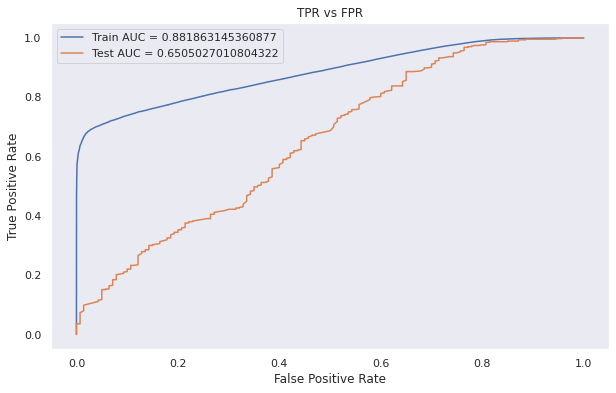

In [119]:
# Plot the ROC curves using the probability predictions made on train and test data.
plt.figure(figsize=(10,6))

plt.plot(train_fpr, train_tpr, label='Train AUC = '+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label='Test AUC = '+str(auc(test_fpr, test_tpr)))

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("TPR vs FPR")
plt.legend()
plt.grid()
plt.show()

In [110]:
#Best threshold is the one where TPR is high and FPR is low
#so we need to maximize TPR and minimize FPR or in other words maximize (1-FPR), therefore we use TPR*(1-FPR) as a metric to find the best threshold
def find_best_threshold(threshold, fpr, tpr):
    #np.argmax returns the index of the highest valued element in the list 
    thresh = threshold[np.argmax(tpr*(1-fpr))] 
    print("The maximum value of TPR*(1-FPR)", max(tpr*(1-fpr)), "for threshold", np.round(thresh,3))
    return thresh

#below function uses the best threshold value as a condition to obtain predicted target classes (i.e. y_pred) from model predicted probabilities
#obtaining y_pred is essential for our next step which is evaluating the model performance
def predict_with_best_t(y_prob, thresh):
    y_pred = np.array([0 if x<thresh else 1 for x in y_prob])
    return y_pred

In [120]:
from sklearn.metrics import confusion_matrix
best_thresh = find_best_threshold(tr_thresholds, train_fpr, train_tpr)

y_train_pred = predict_with_best_t(y_train_prob, best_thresh)
y_test_pred = predict_with_best_t(y_test_prob, best_thresh)

confusion_train = confusion_matrix(y_train_2, y_train_pred)
confusion_test = confusion_matrix(y_test_2, y_test_pred)
print('Confusion Matrix of Train:\n', confusion_train)
print("-"*50)
print('Confusion Matrix of Test:\n', confusion_test)

The maximum value of TPR*(1-FPR) 0.6736208095919007 for threshold 0.42
Confusion Matrix of Train:
 [[17518   700]
 [18537 43364]]
--------------------------------------------------
Confusion Matrix of Test:
 [[139   1]
 [446  30]]


In [121]:
print('Train F1:', f1_score(y_train_2, y_train_pred))
print('Test F1:', f1_score(y_test_2, y_test_pred))

Train F1: 0.8184589251167838
Test F1: 0.1183431952662722


# Deep Learning Models

In [122]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Embedding, LSTM, Conv1D, Flatten, Dense, Dropout, Concatenate
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import set_random_seed
from tensorflow.keras import callbacks
import os
import datetime

In [123]:
#check if gpu is active 
tf.test.gpu_device_name()

'/device:GPU:0'

In [124]:
%load_ext tensorboard

In [125]:
import tensorflow as tf

## Model - 1 (on one hot encoded balanced data)

In [142]:
#set seed for reproducability
set_random_seed(42)
tf.keras.backend.clear_session()

model_1 = tf.keras.Sequential([

    Input(shape=(236, )),
    Dense(100, activation='relu', kernel_initializer = 'he_uniform', ),
    Dropout(0.3),
    
    Dense(256, activation='relu', kernel_initializer= tf.keras.initializers.HeUniform()),
    Dropout(0.4),
    
    Dense(512, activation='relu',kernel_initializer= tf.keras.initializers.HeUniform()),
    Dropout(0.4),

    Dense(1024, activation='relu',kernel_initializer= tf.keras.initializers.HeUniform()),
    Dropout(0.5),

    Dense(1024, activation='relu',kernel_initializer= tf.keras.initializers.HeUniform()),
    Dropout(0.5),
    
    Dense(512, activation='relu',kernel_initializer= tf.keras.initializers.HeUniform()),
    Dropout(0.4),

    Dense(256, activation='relu',kernel_initializer= tf.keras.initializers.HeUniform()),
    Dropout(0.4),

    Dense(128, activation='relu',kernel_initializer= tf.keras.initializers.HeUniform()),
    Dropout(0.4),
    
    Dense(1, activation='sigmoid', name='output_layer')
])

model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               23700     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               25856     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 512)               131584    
                                                                 
 dropout_2 (Dropout)         (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 1024)              5

In [132]:
# https://stackoverflow.com/a/46844409 - custom AUC reference 1
# https://www.kaggle.com/c/santander-customer-transaction-prediction/discussion/80807  - custom AUC reference 2
import tensorflow as tf
from sklearn.metrics import roc_auc_score
def auc_roc(y_true, y_pred):
    return tf.py_function(roc_auc_score, (y_true, y_pred), tf.float32)

In [135]:
#monitor ROC-AUC score and control the callback functions accordingly
path = f'checkpoints_model_1' + '/weights-{epoch:02d}-{val_auc_roc:.4f}.hdf5'
checkpoint_cb = callbacks.ModelCheckpoint(filepath = path, monitor = 'val_auc_roc', save_best_only=True, verbose=0, mode='max')
    
earlystop_cb = callbacks.EarlyStopping(monitor='val_auc_roc', min_delta=0.0001, patience=15, verbose=1, mode='max', restore_best_weights=True)

reduce_lr_cb = callbacks.ReduceLROnPlateau(monitor='val_auc_roc', patience = 5, factor = 0.5, mode='max', min_delta = 0.0001, min_lr=1e-7)

log_dir = os.path.join(f'logs_model_1','fits', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cb = callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1,write_graph=True)

In [136]:
callbacks_1 = [checkpoint_cb, tensorboard_cb, earlystop_cb, reduce_lr_cb]

In [141]:
import shutil 
shutil.rmtree('/content/checkpoints_model_1')
shutil.rmtree('/content/logs_model_1')

In [143]:
model_1.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001) , loss = 'binary_crossentropy', metrics = ['accuracy', auc_roc])

history_1 = model_1.fit(x = X_train, y= y_train, validation_data = [X_test, y_test], batch_size = 256, epochs = 20, verbose = 2, callbacks = callbacks_1)

Epoch 1/20
143/143 - 3s - loss: 0.5931 - accuracy: 0.6661 - auc_roc: 0.7026 - val_loss: 0.7021 - val_accuracy: 0.5210 - val_auc_roc: 0.6563 - lr: 0.0010 - 3s/epoch - 22ms/step
Epoch 2/20
143/143 - 1s - loss: 0.4389 - accuracy: 0.8027 - auc_roc: 0.8519 - val_loss: 0.6874 - val_accuracy: 0.5210 - val_auc_roc: 0.6563 - lr: 0.0010 - 1s/epoch - 9ms/step
Epoch 3/20
143/143 - 1s - loss: 0.4298 - accuracy: 0.8067 - auc_roc: 0.8591 - val_loss: 0.7070 - val_accuracy: 0.5200 - val_auc_roc: 0.6638 - lr: 0.0010 - 1s/epoch - 9ms/step
Epoch 4/20
143/143 - 1s - loss: 0.4238 - accuracy: 0.8098 - auc_roc: 0.8592 - val_loss: 0.6932 - val_accuracy: 0.5231 - val_auc_roc: 0.6631 - lr: 0.0010 - 1s/epoch - 8ms/step
Epoch 5/20
143/143 - 1s - loss: 0.4212 - accuracy: 0.8113 - auc_roc: 0.8604 - val_loss: 0.7230 - val_accuracy: 0.5200 - val_auc_roc: 0.6549 - lr: 0.0010 - 1s/epoch - 9ms/step
Epoch 6/20
143/143 - 1s - loss: 0.4155 - accuracy: 0.8139 - auc_roc: 0.8621 - val_loss: 0.7248 - val_accuracy: 0.5242 - val_

In [145]:
%tensorboard --logdir /content/logs_model_1/fits --port=2216

<IPython.core.display.Javascript object>

In [149]:
model_1 = tf.keras.models.load_model('/content/checkpoints_model_1/weights-09-0.6712.hdf5', custom_objects = {'auc_roc':auc_roc})
loss, acc, auc = model_1.evaluate(X_test,y_test)
print('Loss:', loss)
print('Accuracy:', acc)
print('AUC:', auc)

30/30 [==============================] - 1s 6ms/step - loss: 0.7313 - accuracy: 0.5263 - auc_roc: 0.6732
Loss: 0.7312602996826172
Accuracy: 0.526260495185852
AUC: 0.6732208728790283


In [ ]:
model_1.predict(X_test)

In [151]:
#Best threshold is the one where TPR is high and FPR is low
#so we need to maximize TPR and minimize FPR or in other words maximize (1-FPR), therefore we use TPR*(1-FPR) as a metric to find the best threshold
def find_best_threshold(threshold, fpr, tpr):
    #np.argmax returns the index of the highest valued element in the list 
    thresh = threshold[np.argmax(tpr*(1-fpr))] 
    print("The maximum value of TPR*(1-FPR)", max(tpr*(1-fpr)), "for threshold", np.round(thresh,3))
    return thresh

#below function uses the best threshold value as a condition to obtain predicted target classes (i.e. y_pred) from model predicted probabilities
#obtaining y_pred is essential for our next step which is evaluating the model performance
def predict_with_best_t(y_prob, thresh):
    y_pred = np.array([0 if x<thresh else 1 for x in y_prob])
    return y_pred

In [155]:
y_train_prob = model_1.predict(X_train).reshape(1,-1)[0]
y_test_prob = model_1.predict(X_test).reshape(1,-1)[0]

In [157]:
from sklearn.metrics import confusion_matrix
best_thresh = find_best_threshold(tr_thresholds, train_fpr, train_tpr)

y_train_pred = predict_with_best_t(y_train_prob, best_thresh)
y_test_pred = predict_with_best_t(y_test_prob, best_thresh)

confusion_train = confusion_matrix(y_train, y_train_pred)
confusion_test = confusion_matrix(y_test, y_test_pred)
print('Confusion Matrix of Train:\n', confusion_train)
print("-"*50)
print('Confusion Matrix of Test:\n', confusion_test)

The maximum value of TPR*(1-FPR) 0.6736208095919007 for threshold 0.42
Confusion Matrix of Train:
 [[16884  1334]
 [ 5319 12899]]
--------------------------------------------------
Confusion Matrix of Test:
 [[464  12]
 [436  40]]


In [160]:
accuracy_score(y_test, y_test_pred)

0.5294117647058824

## Model - 2 (on ordinal encoded balanced data)

In [165]:
#model layer parameter values
unique_Nationality = len(df_train_final['Nationality'].unique())
unique_DistributionChannel = len(df_train_final['DistributionChannel'].unique())
unique_MarketSegment = len(df_train_final['MarketSegment'].unique())
unique_Continent = len(df_train_final['Continent'].unique())
unique_AgeGroup = len(df_train_final['AgeGroup'].unique())
unique_RecordCreatedSince = len(df_train_final['RecordCreatedSince'].unique())

In [163]:
#determine embedding layer output_dim based on input_dim using below function
def embed_size(num):
    s = min(50, (num+1)//2)
    return s

In [190]:
#set seed for reproducability
set_random_seed(42)
tf.keras.backend.clear_session()

#building the model 
input_Nationality= Input(shape=(1,))
embed_Nationality= Embedding(input_dim = unique_Nationality, output_dim = embed_size(unique_Nationality), input_length = 1, trainable = True)(input_Nationality)
flatten_Nationality= Flatten()(embed_Nationality)

input_DistributionChannel = Input(shape=(1,))
embed_DistributionChannel = Embedding(input_dim = unique_DistributionChannel, output_dim = embed_size(unique_DistributionChannel), input_length = 1, trainable = True)(input_DistributionChannel)
flatten_DistributionChannel = Flatten()(embed_DistributionChannel)

input_MarketSegment = Input(shape=(1,))
embed_MarketSegment = Embedding(input_dim = unique_MarketSegment, output_dim = embed_size(unique_MarketSegment), input_length = 1, trainable = True)(input_MarketSegment)
flatten_MarketSegment = Flatten()(embed_MarketSegment)

input_Continent = Input(shape=(1,))
embed_Continent = Embedding(input_dim = unique_Continent, output_dim = embed_size(unique_Continent), input_length = 1, trainable = True)(input_Continent)
flatten_Continent = Flatten()(embed_Continent)

input_AgeGroup = Input(shape=(1,))
embed_AgeGroup = Embedding(input_dim = unique_AgeGroup, output_dim = embed_size(unique_AgeGroup), input_length = 1, trainable = True)(input_AgeGroup)
flatten_AgeGroup = Flatten()(embed_AgeGroup)

input_RecordCreatedSince = Input(shape=(1,))
embed_RecordCreatedSince = Embedding(input_dim = unique_RecordCreatedSince, output_dim = embed_size(unique_RecordCreatedSince), input_length = 1, trainable = True)(input_RecordCreatedSince)
flatten_RecordCreatedSince = Flatten()(embed_RecordCreatedSince)


input_other_features = Input(shape=(22,))
dense_other_features = Dense(512, activation='relu', kernel_initializer = 'he_uniform')(input_other_features)

concat = Concatenate()([flatten_Nationality, flatten_DistributionChannel, flatten_MarketSegment, flatten_Continent, flatten_AgeGroup, flatten_RecordCreatedSince, dense_other_features])

dense_1 = Dense(16, activation='relu', kernel_initializer = 'he_uniform')(concat)
dropout_1 = Dropout(0.4)(dense_1)

dense_2 = Dense(32, activation='relu', kernel_initializer = 'he_uniform')(dropout_1)
dropout_2 = Dropout(0.4)(dense_2)

dense_3 = Dense(64, activation='relu', kernel_initializer = 'he_uniform')(dropout_2)
dropout_3 = Dropout(0.4)(dense_3)

dense_4 = Dense(128, activation='relu', kernel_initializer = 'he_uniform')(dropout_3)
dropout_4 = Dropout(0.4)(dense_4)


dense_5 = Dense(256, activation='relu', kernel_initializer = 'he_uniform')(dropout_4)
dropout_5 = Dropout(0.4)(dense_5)


dense_6 = Dense(512, activation='relu', kernel_initializer = 'he_uniform')(dropout_5)
dropout_6 = Dropout(0.5)(dense_6)

dense_7= Dense(1024, activation='relu', kernel_initializer = 'he_uniform')(dropout_6)

output_layer = Dense(1, activation='sigmoid')(dense_7)


model_2 = Model(inputs = [input_Nationality, input_DistributionChannel, input_MarketSegment,input_Continent, input_AgeGroup, input_RecordCreatedSince, input_other_features], 
                outputs=[output_layer])

print(model_2.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 1)]          0           []                               
                                                                                              

In [168]:
# https://stackoverflow.com/a/46844409 - custom AUC reference 1
# https://www.kaggle.com/c/santander-customer-transaction-prediction/discussion/80807  - custom AUC reference 2
import tensorflow as tf
from sklearn.metrics import roc_auc_score
def auc_roc(y_true, y_pred):
    return tf.py_function(roc_auc_score, (y_true, y_pred), tf.float32)

In [178]:
#monitor ROC-AUC score and control the callback functions accordingly
path = f'checkpoints_model_2' + '/weights-{epoch:02d}-{val_auc_roc:.4f}.hdf5'
checkpoint_cb = callbacks.ModelCheckpoint(filepath = path, monitor = 'val_auc_roc', save_best_only=True, verbose=0, mode='max')
    
earlystop_cb = callbacks.EarlyStopping(monitor='val_auc_roc', min_delta=0.0001, patience=15, verbose=1, mode='max', restore_best_weights=True)

reduce_lr_cb = callbacks.ReduceLROnPlateau(monitor='val_auc_roc', patience = 5, factor = 0.5, mode='max', min_delta = 0.0001, min_lr=1e-7)

log_dir = os.path.join(f'logs_model_2','fits', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cb = callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1,write_graph=True)

In [184]:
callbacks_2 = [checkpoint_cb, tensorboard_cb, earlystop_cb, reduce_lr_cb]

In [189]:
import shutil
shutil.rmtree('/content/logs_model_2')
shutil.rmtree('/content/checkpoints_model_2')

In [191]:
# compile and fit your model
model_2.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001) , loss = 'binary_crossentropy', metrics = ['accuracy', auc_roc])

history_2 = model_2.fit(x = [X_train_3[:,0].reshape(-1,1), X_train_3[:,1].reshape(-1,1), X_train_3[:,2].reshape(-1,1), X_train_3[:,3].reshape(-1,1), X_train_3[:,4].reshape(-1,1), X_train_3[:,5].reshape(-1,1),
                             X_train_3[:,6:]], y = y_train_3,
                            validation_split = 0.1, batch_size = 256, epochs = 30, verbose = 2, callbacks = callbacks_2)

Epoch 1/30
129/129 - 3s - loss: 0.6970 - accuracy: 0.5138 - auc_roc: 0.5122 - val_loss: 0.6933 - val_accuracy: 0.4857 - val_auc_roc: 0.5003 - lr: 0.0010 - 3s/epoch - 24ms/step
Epoch 2/30
129/129 - 1s - loss: 0.6933 - accuracy: 0.5026 - auc_roc: 0.5058 - val_loss: 0.6929 - val_accuracy: 0.5143 - val_auc_roc: 0.5000 - lr: 0.0010 - 1s/epoch - 11ms/step
Epoch 3/30
129/129 - 1s - loss: 0.6933 - accuracy: 0.5034 - auc_roc: 0.5069 - val_loss: 0.6929 - val_accuracy: 0.5143 - val_auc_roc: 0.5003 - lr: 0.0010 - 1s/epoch - 10ms/step
Epoch 4/30
129/129 - 1s - loss: 0.6856 - accuracy: 0.5213 - auc_roc: 0.5273 - val_loss: 0.6652 - val_accuracy: 0.5947 - val_auc_roc: 0.5841 - lr: 0.0010 - 1s/epoch - 11ms/step
Epoch 5/30
129/129 - 1s - loss: 0.6713 - accuracy: 0.5447 - auc_roc: 0.5466 - val_loss: 0.6629 - val_accuracy: 0.5955 - val_auc_roc: 0.5846 - lr: 0.0010 - 1s/epoch - 11ms/step
Epoch 6/30
129/129 - 1s - loss: 0.6657 - accuracy: 0.5494 - auc_roc: 0.5523 - val_loss: 0.6508 - val_accuracy: 0.5960 - 

# Conclusion:

- The raw dataset does not contain features that are contributing much to our task but with some feature engineering we wer able to extract some decently correlated features.

- With some more domain knowledge and Model Optimization we may be able to develop models with decent performance which are deployment worthy